In [1]:
%matplotlib inline

In [2]:
!pip install -U imbalanced-learn
!pip install --upgrade albumentations
!pip uninstall opencv-python-headless
!pip install opencv-python-headless==4.1.2.30

     |████████████████████████████████| 199 kB 7.6 MB/s 
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.8.1
    Uninstalling imbalanced-learn-0.8.1:
      Successfully uninstalled imbalanced-learn-0.8.1
     |████████████████████████████████| 102 kB 6.4 MB/s 
     |████████████████████████████████| 47.8 MB 1.4 MB/s 
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12
Found existing installation: opencv-python-headless 4.5.5.64
Uninstalling opencv-python-headless-4.5.5.64:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless-4.5.5.64.dist-info/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavcodec-65fa80df.so.58.134.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavformat-8e

In [3]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import *
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.preprocessing.image import *
import numpy as np
import pandas as pd
import os
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow # for image display
from matplotlib import pyplot as plt
import sklearn as sk
import seaborn as sns

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Prepare data

In [5]:
CSV_PATH = "/content/drive/MyDrive/Tesis/Datasets/Products/annotations.csv"
IMAGES_PATH = "/content/drive/MyDrive/Tesis/Datasets/Products/Images/"

In [6]:

def pre_process_data(path,images_path =""):
  colnames=['filename','xmin', 'ymin', 'xmax', 'ymax',\
            'class','width','height']
  
  annotate_data=pd.read_csv(path,header=None)
  annotate_data.columns = colnames
  annotate_data['filename'] = images_path+annotate_data['filename'].astype(str)
  annotate_data = annotate_data[['filename', 'class','width', 'height', 'xmin','ymin','xmax','ymax']]
  #annotate_data = annotate_data[annotate_data['class'] != 1]
  return annotate_data

images_df = pre_process_data(CSV_PATH,IMAGES_PATH)

In [7]:
images_df.head()

,filename,class,width,height,xmin,ymin,xmax,ymax
0,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,263,173,598,729
1,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,610,87,789,747
2,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,798,155,959,753
3,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,965,170,1144,747
4,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,1141,164,1332,759


In [8]:
images_df.dtypes

filename    object
class        int64
width        int64
height       int64
xmin         int64
ymin         int64
xmax         int64
ymax         int64
dtype: object

In [9]:
num_classes = len(list(images_df['class'].unique()))
num_classes

13

In [10]:
classes_ids = list(images_df['class'].unique())
classes_ids.sort()
classes_ids

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]

In [11]:
ids = {'object':0,'fluo_cardent':1,'zucaritas':2,'chocokrispis':3,'fruit_loops':4,'colombiana':5,'manzana':6,'pepsi':7,'corn_flakes':8,'papas_limon':9,'colgate':10,'papas_pollo':11,'papas_natural':12}
for k in ids.keys():
    ids[k] += 1
category_id_to_name = {ids[k]:k for k in ids.keys()}

classes_names = [category_id_to_name[i] for i in classes_ids]
classes_names

['object',
 'fluo_cardent',
 'zucaritas',
 'chocokrispis',
 'fruit_loops',
 'colombiana',
 'manzana',
 'pepsi',
 'corn_flakes',
 'papas_limon',
 'colgate',
 'papas_pollo',
 'papas_natural']

In [12]:
class_count = {classes_names[i]:0 for i in range(len(classes_names))}
total_crops=0
for index,row in images_df.iterrows():
  class_count[category_id_to_name[row['class']]] += 1
  total_crops += 1
class_count


{'chocokrispis': 173,
 'colgate': 104,
 'colombiana': 90,
 'corn_flakes': 49,
 'fluo_cardent': 108,
 'fruit_loops': 157,
 'manzana': 70,
 'object': 5840,
 'papas_limon': 112,
 'papas_natural': 90,
 'papas_pollo': 93,
 'pepsi': 46,
 'zucaritas': 141}

In [ ]:
#Calcular el promedio
total_sum = 0
for k in class_count.keys():
  if k != 'object':
    total_sum += class_count[k]

(total_sum/(num_classes-1))

102.75

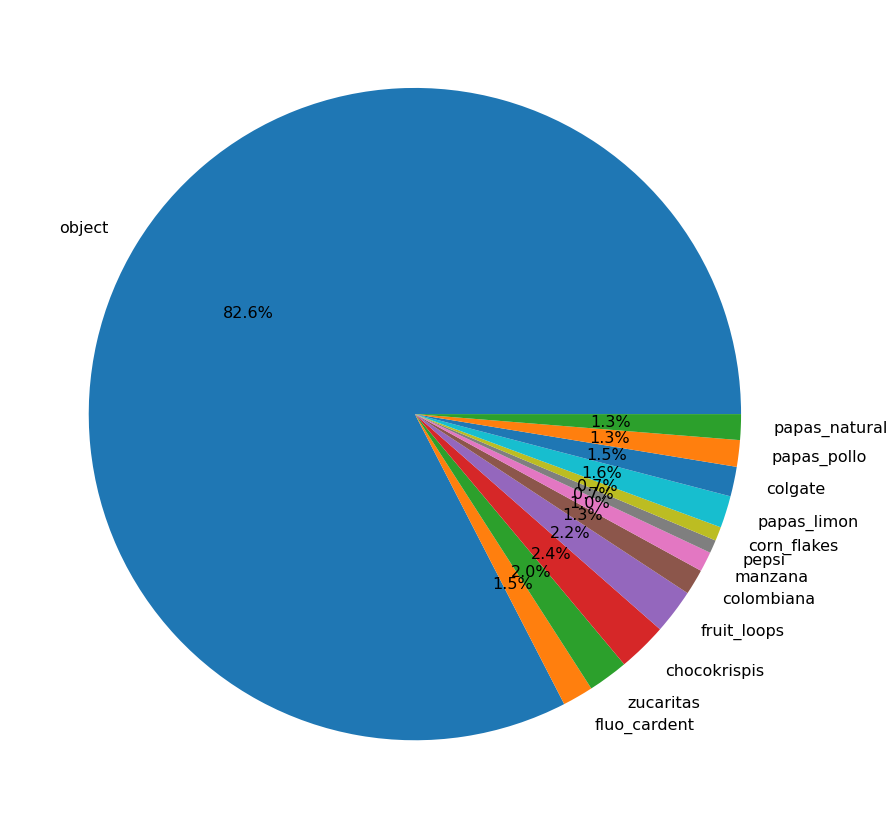

In [ ]:
#print(sum([class_count[k]/total_crops for k in class_count.keys()]))
plt.figure(figsize=(15, 15))
plt.pie([class_count[k]/total_crops for k in class_count.keys()],labels=class_count.keys(),autopct='%1.1f%%',textprops={'fontsize': 16})
plt.show()

## Undersampling Object class and Chocokrispis

In [ ]:
images_df_tmp = images_df.loc[images_df["class"].isin([1,4])] #solo se toma chocokrispis y object
images_df_tmp.head()

,filename,class,width,height,xmin,ymin,xmax,ymax
0,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,263,173,598,729
1,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,610,87,789,747
2,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,798,155,959,753
3,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,965,170,1144,747
4,/content/drive/MyDrive/Tesis/Datasets/Products...,1,3024,4032,1141,164,1332,759


In [ ]:
num_classes = len(list(images_df_tmp['class'].unique()))
num_classes

2

In [ ]:
class_count = {classes_names[i]:0 for i in range(len(classes_names))}
total_crops=0
for index,row in images_df_tmp.iterrows():
  class_count[category_id_to_name[row['class']]] += 1
  total_crops += 1
class_count

{'chocokrispis': 173,
 'colgate': 0,
 'colombiana': 0,
 'corn_flakes': 0,
 'fluo_cardent': 0,
 'fruit_loops': 0,
 'manzana': 0,
 'object': 5840,
 'papas_limon': 0,
 'papas_natural': 0,
 'papas_pollo': 0,
 'pepsi': 0,
 'zucaritas': 0}

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
undersample = RandomUnderSampler(sampling_strategy='majority')
X_over, y_over = undersample.fit_resample(images_df_tmp.drop(['class'],axis=1), images_df_tmp['class'])

In [ ]:
images_df_tmp = (X_over.merge(y_over.to_frame(),left_index=True,right_index=True))
images_df_tmp.head()

,filename,width,height,xmin,ymin,xmax,ymax,class
0,/content/drive/MyDrive/Tesis/Datasets/Products...,3024,4032,2843,1430,2926,1741,1
1,/content/drive/MyDrive/Tesis/Datasets/Products...,3024,4032,1757,840,2283,1730,1
2,/content/drive/MyDrive/Tesis/Datasets/Products...,3024,4032,482,471,762,993,1
3,/content/drive/MyDrive/Tesis/Datasets/Products...,3024,4032,1590,26,1719,490,1
4,/content/drive/MyDrive/Tesis/Datasets/Products...,3024,4032,1856,2967,2265,3382,1


In [ ]:
class_count = {classes_names[i]:0 for i in range(len(classes_names))}
total_crops=0
for index,row in images_df_tmp.iterrows():
  class_count[category_id_to_name[row['class']]] += 1
  total_crops += 1
class_count

{'chocokrispis': 173,
 'colgate': 0,
 'colombiana': 0,
 'corn_flakes': 0,
 'fluo_cardent': 0,
 'fruit_loops': 0,
 'manzana': 0,
 'object': 173,
 'papas_limon': 0,
 'papas_natural': 0,
 'papas_pollo': 0,
 'pepsi': 0,
 'zucaritas': 0}

In [ ]:
num_classes = len(list(images_df_tmp['class'].unique()))
num_classes

2

In [ ]:
images_df = images_df[~images_df["class"].isin([1,4])] #tomas todas las clases menos chocockrispis y object
class_count = {classes_names[i]:0 for i in range(len(classes_names))}
total_crops=0
for index,row in images_df.iterrows():
  class_count[category_id_to_name[row['class']]] += 1
  total_crops += 1
class_count

{'chocokrispis': 0,
 'colgate': 104,
 'colombiana': 90,
 'corn_flakes': 49,
 'fluo_cardent': 108,
 'fruit_loops': 157,
 'manzana': 70,
 'object': 0,
 'papas_limon': 112,
 'papas_natural': 90,
 'papas_pollo': 93,
 'pepsi': 46,
 'zucaritas': 141}

In [ ]:
images_df = pd.concat([images_df,images_df_tmp])
images_df.head()

,filename,class,width,height,xmin,ymin,xmax,ymax
150,/content/drive/MyDrive/Tesis/Datasets/Products...,8,3024,4032,18,6,275,520
151,/content/drive/MyDrive/Tesis/Datasets/Products...,7,3024,4032,320,12,520,526
152,/content/drive/MyDrive/Tesis/Datasets/Products...,6,3024,4032,1282,9,1506,502
153,/content/drive/MyDrive/Tesis/Datasets/Products...,6,3024,4032,1034,9,1261,505
154,/content/drive/MyDrive/Tesis/Datasets/Products...,7,3024,4032,1153,711,1458,1936


In [ ]:
#images_df = images_df[~images_df["class"].isin([1,4])] #tomas todas las clases menos chocockrispis y object
class_count = {classes_names[i]:0 for i in range(len(classes_names))}
total_crops=0
for index,row in images_df.iterrows():
  class_count[category_id_to_name[row['class']]] += 1
  total_crops += 1
class_count

{'chocokrispis': 173,
 'colgate': 104,
 'colombiana': 90,
 'corn_flakes': 49,
 'fluo_cardent': 108,
 'fruit_loops': 157,
 'manzana': 70,
 'object': 173,
 'papas_limon': 112,
 'papas_natural': 90,
 'papas_pollo': 93,
 'pepsi': 46,
 'zucaritas': 141}

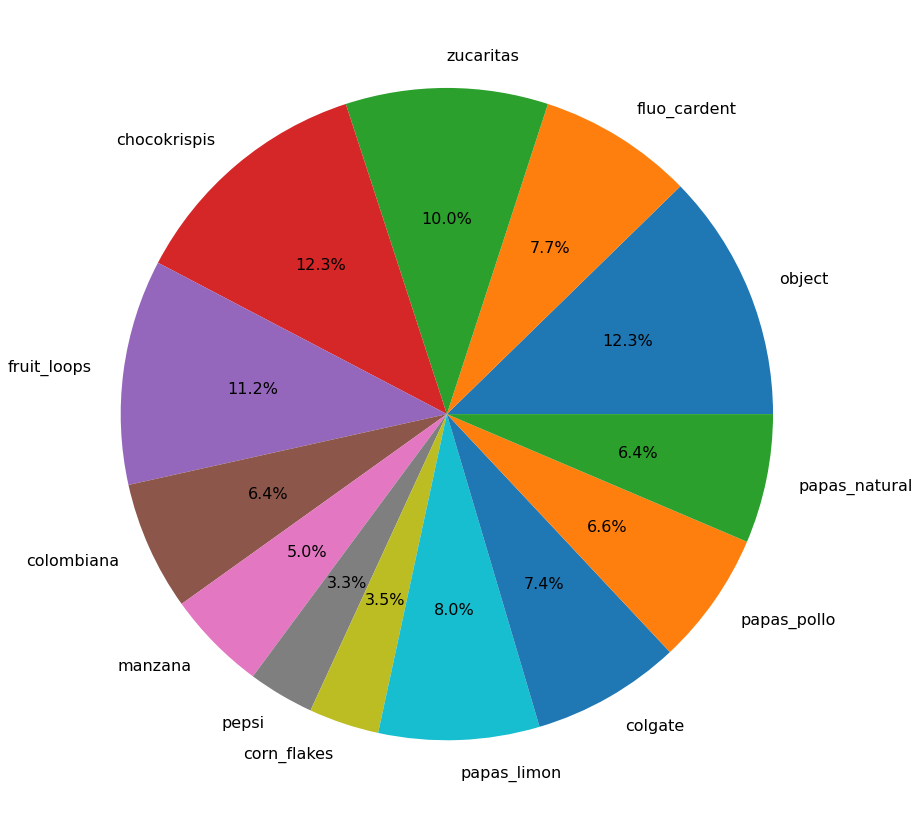

In [ ]:
#print(sum([class_count[k]/total_crops for k in class_count.keys()]))
plt.figure(figsize=(15, 15))
plt.pie([class_count[k]/total_crops for k in class_count.keys()],labels=class_count.keys(),autopct='%1.1f%%',textprops={'fontsize': 16})
plt.show()

In [ ]:

cwd = os.getcwd()
dir = os.path.join(cwd,"images")

if not os.path.exists(dir): os.mkdir(dir)

#dir = os.path.join(cwd,"images",filter)
#if not os.path.exists(dir): os.mkdir(dir)

for name in classes_ids:
  dir = os.path.join(cwd,"images",str(name))
  if not os.path.exists(dir):
    os.mkdir(dir)
  


## Filters data augmentation 

In [ ]:
import cv2
import albumentations as A

In [ ]:

def visualize(image):
    img = image.copy()
    plt.figure(figsize=(5, 5))
    plt.axis('off')
    plt.imshow(img)


def make_transformation(df,filter,transform,save=True,show=True,stop=False,N=20):
  crops_names = {name:0 for name in category_id_to_name}
  #N = 20
  for index,row in df.iterrows():
    xmin,ymin,xmax,ymax = row['xmin'],row['ymin'],row['xmax'],row['ymax']
    w,h = xmax-xmin,ymax-ymin
    image = cv2.imread(row["filename"])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image[ymin:ymin+h,xmin:xmin+w]
    image = transform(image = image)['image']
    dir = os.path.join(cwd,"images",str(row["class"]),category_id_to_name[row['class']]+"_"+filter+"_"+str(crops_names[row['class']])+".jpg")
    crops_names[row['class']] += 1
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    if(save):cv2.imwrite(dir,image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    if(show and N > 0):
      visualize(image)
    if(stop and N <= 0):
      break
    #else:break
    #break
    N -= 1


### Blur

In [ ]:
transform = A.Compose([A.GaussianBlur(p=1.0,blur_limit=(15,35),always_apply=True)])
filter = "blur"

CPU times: user 9min 17s, sys: 11.6 s, total: 9min 29s
Wall time: 10min 56s


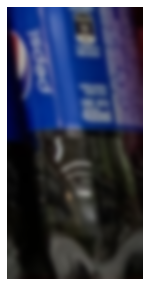

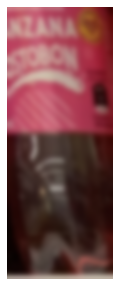

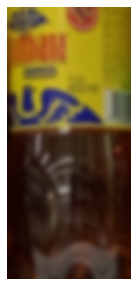

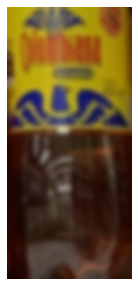

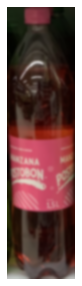

...

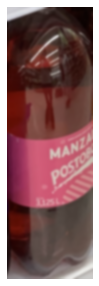

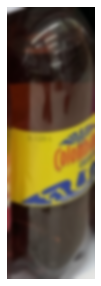

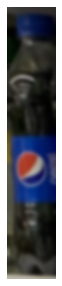

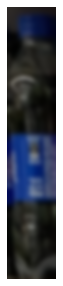

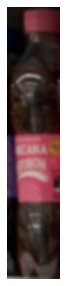

In [ ]:
%%time
make_transformation(images_df,filter,transform)


### Brightness

In [ ]:
transform = A.Compose([A.RandomBrightnessContrast(brightness_limit=[-0.4,0.7], p=1.0)])
filter = "brightness"

CPU times: user 7min 59s, sys: 9.95 s, total: 8min 9s
Wall time: 8min 10s


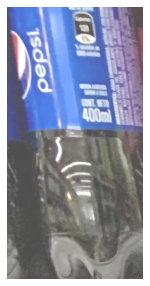

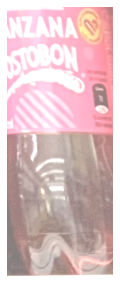

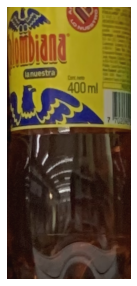

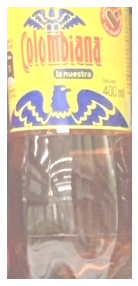

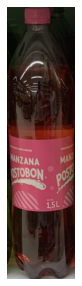

...

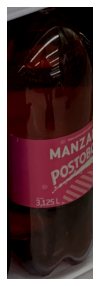

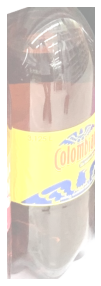

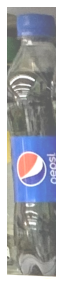

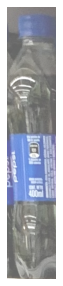

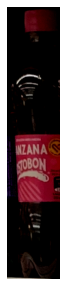

In [ ]:
%%time
make_transformation(images_df,filter,transform)


### Grayscale

In [ ]:
transform = A.Compose([A.ToGray(p=1.0)])
filter = "gray"

CPU times: user 8min 17s, sys: 12.1 s, total: 8min 29s
Wall time: 8min 29s


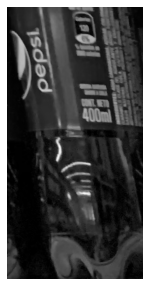

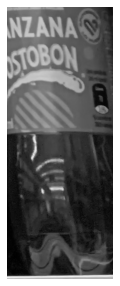

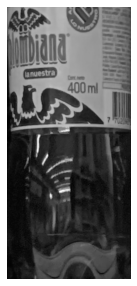

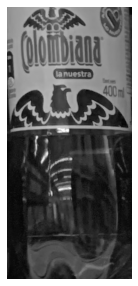

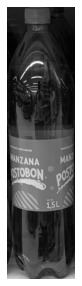

...

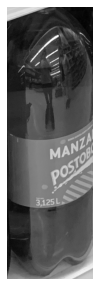

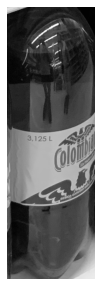

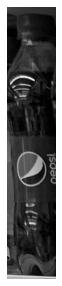

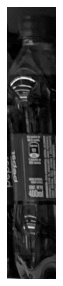

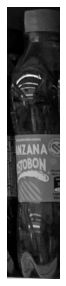

In [ ]:
%%time
make_transformation(images_df,filter,transform)

### Rotation(Flip)

In [ ]:
transform = A.Compose([A.Flip(always_apply=True,p=1.0)])
filter = "rotation"

CPU times: user 8min 12s, sys: 10.8 s, total: 8min 23s
Wall time: 8min 28s


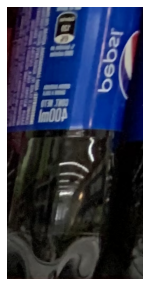

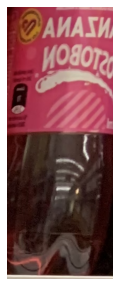

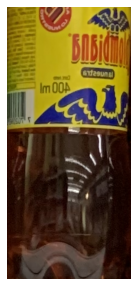

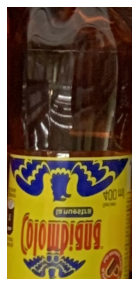

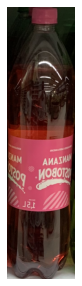

...

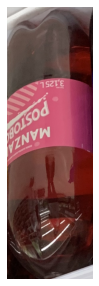

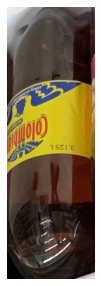

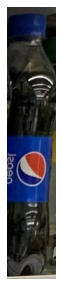

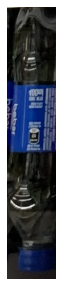

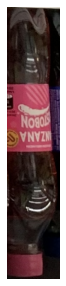

In [ ]:
%%time
make_transformation(images_df,filter,transform)


### Color change

In [ ]:
transform = A.Compose([A.ColorJitter(hue=0.06,contrast=0.5,always_apply=True,p=1.0)])
filter = "color"

CPU times: user 8min 18s, sys: 10.5 s, total: 8min 28s
Wall time: 8min 25s


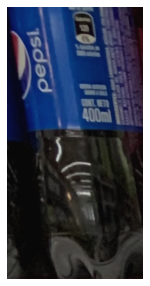

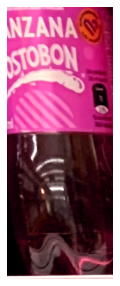

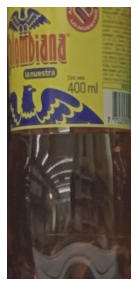

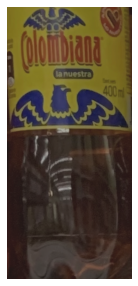

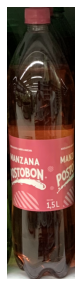

...

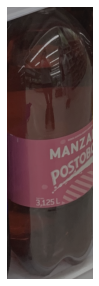

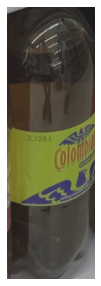

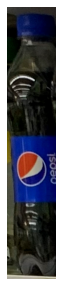

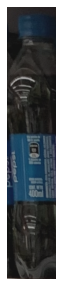

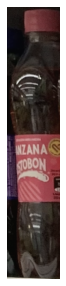

In [ ]:
%%time
make_transformation(images_df,filter,transform)
#make_transformation(images_df,filter,transform,save=False,show=True,stop=True,N=50)


In [ ]:
transform = A.ImageCompression(quality_lower=1, quality_upper=15,always_apply=True,p=1.0)
filter = "compression"

make_transformation(images_df,filter,transform,save=False,show=True,stop=True,N=50)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
transform = A.MedianBlur(blur_limit= (9, 9),always_apply=True,p=1.0)
filter = "medianBlur"

make_transformation(images_df,filter,transform,save=False,show=True,stop=True,N=50)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
transform = A.Superpixels(always_apply=True,p=1.0)
filter = "superpixels"

make_transformation(images_df,filter,transform,save=False,show=True,stop=True,N=50)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#https://albumentations.ai/docs/api_reference/augmentations/transforms/
transform = A.Emboss(alpha=(0.7, 1.0),strength=(0.5, 0.7),always_apply=True,p=1.0)
filter = "emboss"

make_transformation(images_df,filter,transform,save=False,show=True,stop=True,N=50)

Output hidden; open in https://colab.research.google.com to view.

### Transpose

In [ ]:
transform = A.Compose([A.Transpose(p=1.0)])
filter = "transpose"

CPU times: user 8min 13s, sys: 10.6 s, total: 8min 23s
Wall time: 8min 24s


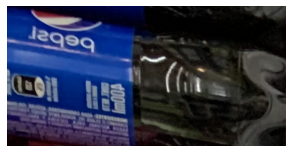

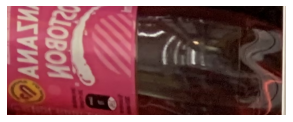

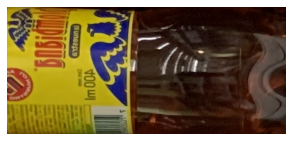

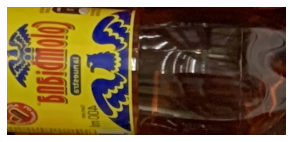

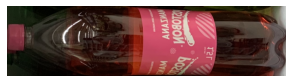

...

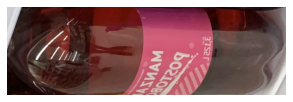

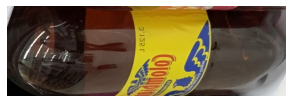

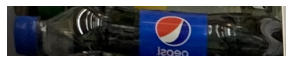

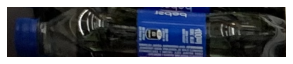

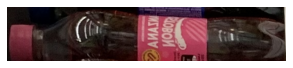

In [ ]:
%%time
make_transformation(images_df,filter,transform)


In [ ]:
classes_ids = list(images_df['class'].unique())
classes_ids.sort()
classes_ids

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]

In [ ]:
cwd = os.getcwd()
dir = os.path.join(cwd,"images")

if not os.path.exists(dir): os.mkdir(dir)

class_count = {classes_ids[i]:0 for i in range(len(classes_ids))}
total_crops = 0
for name in classes_ids:
  dir = os.path.join(cwd,"images",str(name))
  if(os.path.exists(dir)):
    class_count[name] += len(os.listdir(dir))
    total_crops += len(os.listdir(dir))
class_count

{1: 1038,
 2: 648,
 3: 846,
 4: 1038,
 5: 942,
 6: 540,
 7: 420,
 8: 276,
 9: 294,
 10: 672,
 11: 624,
 12: 558,
 13: 540}

In [ ]:
num_classes = len(list(images_df['class'].unique()))
num_classes

13

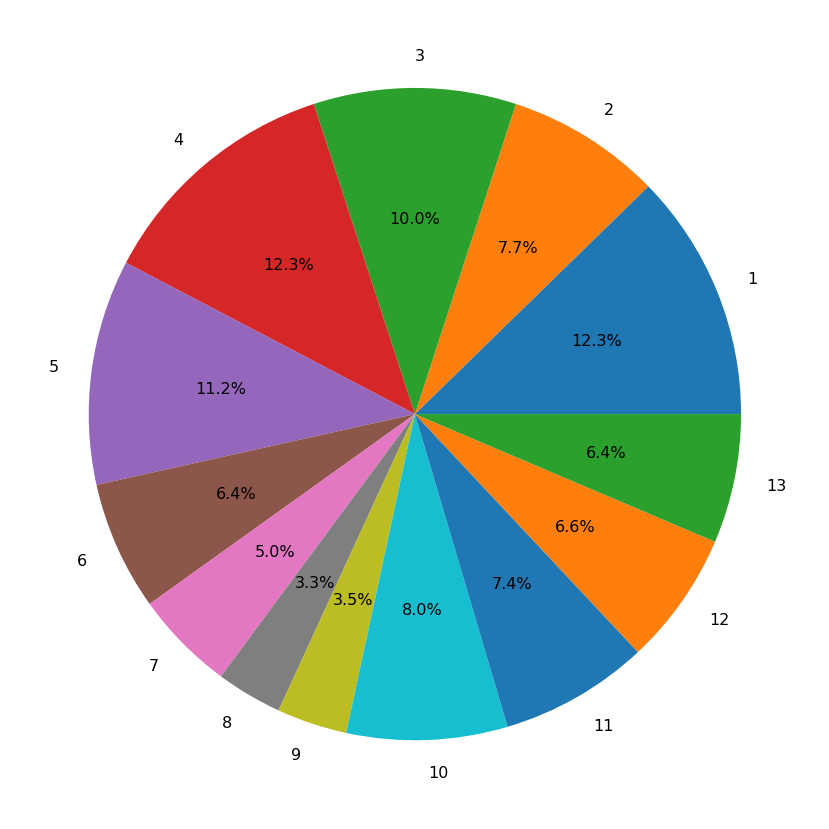

In [ ]:
#print(sum([class_count[k]/total_crops for k in class_count.keys()]))
plt.figure(figsize=(15, 15))
plt.pie([class_count[k]/total_crops for k in class_count.keys()],labels=class_count.keys(),autopct='%1.1f%%',textprops={'fontsize': 16})
plt.show()

## Make crops for images

In [ ]:
#Create directory for each class
cwd = os.getcwd()
dir = os.path.join(cwd,"images")

if not os.path.exists(dir): os.mkdir(dir)
for name in classes_ids:
  dir = os.path.join(cwd,"images",str(name))
  if not os.path.exists(dir):
    os.mkdir(dir)


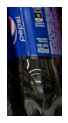

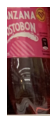

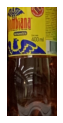

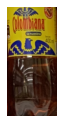

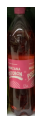

...

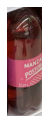

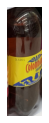

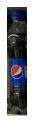

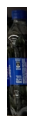

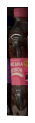

In [ ]:
crops_names = {name:0 for name in category_id_to_name}
dims = []
def make_partitions():
  N = 20
  for index,row in images_df.iterrows():
    xmin,ymin,xmax,ymax = row['xmin'],row['ymin'],row['xmax'],row['ymax']
    w,h = xmax-xmin,ymax-ymin
    img = cv2.imread(row['filename'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img[ymin:ymin+h,xmin:xmin+w]
    #dir = os.path.join(cwd,"images",category_id_to_name[row['class']],category_id_to_name[row['class']]+str(crops_names[row['class']])+".jpg")
    dir = os.path.join(cwd,"images",str(row['class']),category_id_to_name[row['class']]+str(crops_names[row['class']])+".jpg")
    
    crops_names[row['class']] += 1
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.imwrite(dir,img)
    dims.append(img.shape)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if N > 0:
      plt.figure(figsize=(2, 2))
      plt.axis('off')
      plt.imshow(img)
    
    N -= 1
make_partitions()

In [ ]:
crops_names

{1: 173,
 2: 108,
 3: 141,
 4: 173,
 5: 157,
 6: 90,
 7: 70,
 8: 46,
 9: 49,
 10: 112,
 11: 104,
 12: 93,
 13: 90}

# Final dataset

In [ ]:
cwd = os.getcwd()
dir = os.path.join(cwd,"images")

if not os.path.exists(dir): os.mkdir(dir)

class_count = {classes_ids[i]:0 for i in range(len(classes_ids))}
total_crops = 0
for name in classes_ids:
  dir = os.path.join(cwd,"images",str(name))
  if(os.path.exists(dir)):
    class_count[name] += len(os.listdir(dir))
    total_crops += len(os.listdir(dir))
class_count

{1: 1211,
 2: 756,
 3: 987,
 4: 1211,
 5: 1099,
 6: 630,
 7: 490,
 8: 322,
 9: 343,
 10: 784,
 11: 728,
 12: 651,
 13: 630}

In [ ]:
total_crops

9842

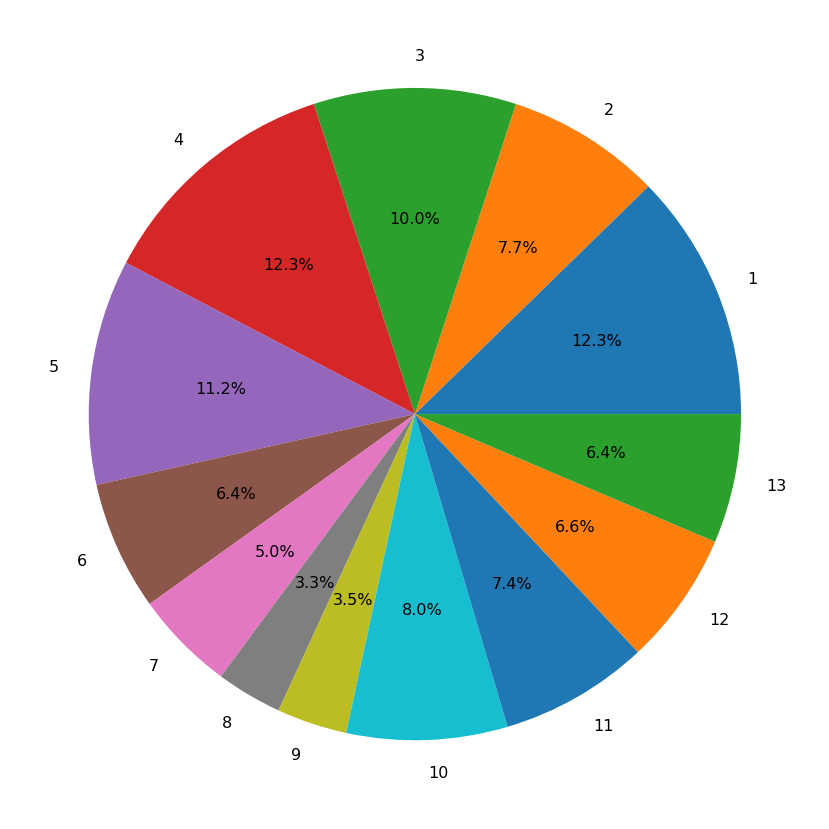

In [ ]:
plt.figure(figsize=(15, 15))
plt.pie([class_count[k]/total_crops for k in class_count.keys()],labels=class_count.keys(),autopct='%1.1f%%',textprops={'fontsize': 16})
plt.show()

## Fix balance

In [ ]:
#['chocokrispis','object'],['pepsi','corn_flakes'] ids -> delete and augment
import random
cwd = os.getcwd()
dir = os.path.join(cwd,"images")

if not os.path.exists(dir): os.mkdir(dir)

classes_to_undersample = ['chocokrispis','object']

percent = 11/100

for name in classes_to_undersample:
  dir = os.path.join(cwd,"images",str(ids[name]))
  if(os.path.exists(dir)):
    files = os.listdir(dir)
    N = (len(files)-(percent*total_crops))//(1-percent)
    print(N)
    while(N > 0 and len(files)):
      i = random.randint(0,len(files)-1)
      os.remove(os.path.join(dir,files[i]))
      #print(os.path.join(dir,files[i]))
      files.pop(i)
      total_crops -= 1
      N -=1
    #print()
    #break




144.0
162.0


In [ ]:

cwd = os.getcwd()
dir = os.path.join(cwd,"images")

if not os.path.exists(dir): os.mkdir(dir)
classes_to_oversample = ['pepsi','corn_flakes']

percent = 5/100


transformations=[A.ImageCompression(quality_lower=1, quality_upper=15,always_apply=True,p=1.0),
                 A.MedianBlur(blur_limit= (9, 9),always_apply=True,p=1.0),
                 A.Superpixels(always_apply=True,p=1.0),
                  A.Emboss(alpha=(0.7, 1.0),strength=(0.5, 0.7),always_apply=True,p=1.0)]
filters_names = ["compression", "medianBlur", "superpixels","emboss"]
for name in classes_to_oversample:
  dir = os.path.join(cwd,"images",str(ids[name]))
  if(os.path.exists(dir)):
    files = os.listdir(dir)
    N = (len(files)-(percent*total_crops))//(percent-1)
    #N = abs(N)
    print(N)
    df = images_df.loc[images_df["class"].isin([int(ids[name])])] #solo se toma la clase que se desea aumentar
    i = 0
    while(N > 0 and i < len(transformations)):
      #os.remove(os.path.join(dir,files[i]))
      #print(os.path.join(dir,files[i]))
      make_transformation(df,filters_names[i],transformations[i],save=True,show=False)
      i += 1
      total_crops += df.shape[0]
      N -= df.shape[0]
    print(N,i)
    if(N >0 ):print("ERROR")


162.0


/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/functional.py:1753: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  segments = skimage.segmentation.slic(image, n_segments=n_segments, compactness=10)


-22.0 4
150.0
-46.0 4


In [ ]:
cwd = os.getcwd()
dir = os.path.join(cwd,"images")

if not os.path.exists(dir): os.mkdir(dir)

class_count = {classes_ids[i]:0 for i in range(len(classes_ids))}
total_crops = 0
for name in classes_ids:
  dir = os.path.join(cwd,"images",str(name))
  if(os.path.exists(dir)):
    class_count[name] += len(os.listdir(dir))
    total_crops += len(os.listdir(dir))
class_count

{1: 1049,
 2: 756,
 3: 987,
 4: 1067,
 5: 1099,
 6: 630,
 7: 490,
 8: 506,
 9: 539,
 10: 784,
 11: 728,
 12: 651,
 13: 630}

In [ ]:
total_crops

9916

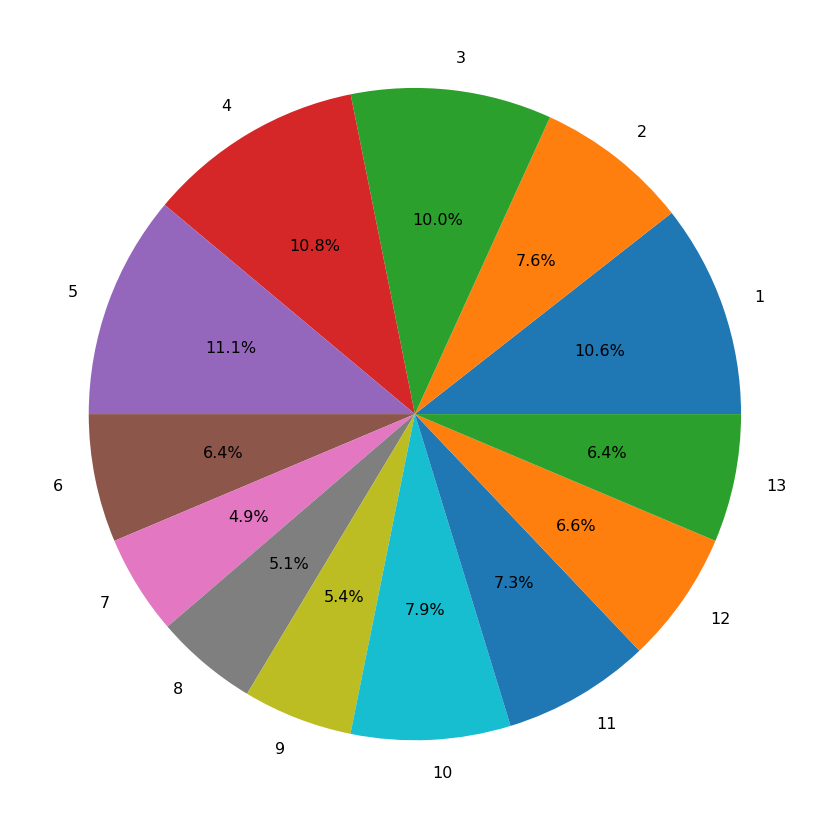

In [ ]:
plt.figure(figsize=(15, 15))
plt.pie([class_count[k]/total_crops for k in class_count.keys()],labels=class_count.keys(),autopct='%1.1f%%',textprops={'fontsize': 16})
plt.show()

In [ ]:
!zip -r '/content/images.zip' '/content/images'

Se truncaron las últimas líneas 5000 del resultado de transmisión.
  adding: content/images/10/papas_limon15.jpg (deflated 0%)
  adding: content/images/10/papas_limon_brightness_48.jpg (deflated 1%)
  adding: content/images/10/papas_limon_rotation_13.jpg (deflated 0%)
  adding: content/images/10/papas_limon_brightness_63.jpg (deflated 0%)
  adding: content/images/10/papas_limon_gray_61.jpg (deflated 0%)
  adding: content/images/10/papas_limon_transpose_57.jpg (deflated 0%)
  adding: content/images/10/papas_limon_brightness_98.jpg (deflated 0%)
  adding: content/images/10/papas_limon_transpose_27.jpg (deflated 0%)
  adding: content/images/10/papas_limon_color_63.jpg (deflated 0%)
  adding: content/images/10/papas_limon_blur_45.jpg (deflated 2%)
  adding: content/images/10/papas_limon_transpose_58.jpg (deflated 1%)
  adding: content/images/10/papas_limon_color_78.jpg (deflated 1%)
  adding: content/images/10/papas_limon_transpose_45.jpg (deflated 1%)
  adding: content/images/10/papas_lim

In [13]:
#data_dir = os.path.join(cwd,"images")
#train_dir = "/content/drive/MyDrive/Tesis/Datasets/filters_images_processed/train"
#val_dir = "/content/drive/MyDrive/Tesis/Datasets/filters_images_processed/val"
#test_dir = "/content/drive/MyDrive/Tesis/Datasets/filters_images_processed/test"

train_dir = "/content/drive/MyDrive/Tesis/Datasets/filters_images_midbalanced_processed/train"
val_dir = "/content/drive/MyDrive/Tesis/Datasets/filters_images_midbalanced_processed/val"
test_dir = "/content/drive/MyDrive/Tesis/Datasets/filters_images_midbalanced_processed/test"


#Resnet 

In [14]:
img_height,img_width = 224,224
batch_size = 32

In [15]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  train_dir,
  label_mode = 'int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)#porque batch size?


Found 5945 files belonging to 13 classes.


In [16]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  val_dir,
  label_mode = 'int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)#porque batch size?

Found 1978 files belonging to 13 classes.


In [17]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
  test_dir,
  label_mode = 'int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)#porque batch size?

Found 1993 files belonging to 13 classes.


In [18]:
train_ds.class_names

['1', '10', '11', '12', '13', '2', '3', '4', '5', '6', '7', '8', '9']

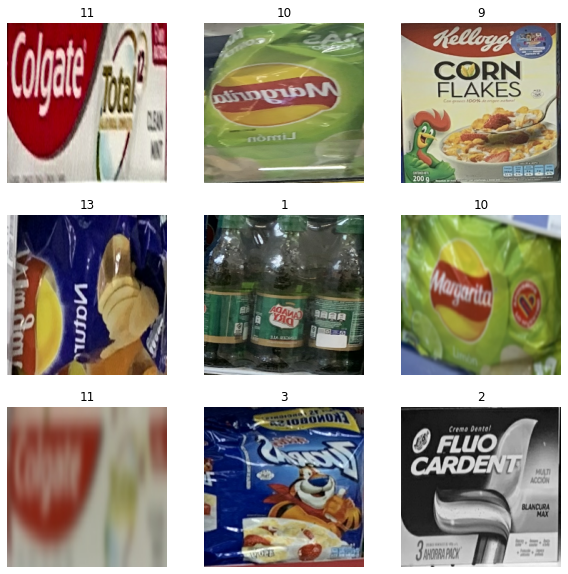

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(train_ds.class_names[labels[i]])
    plt.axis("off")


In [ ]:
#https://keras.io/guides/transfer_learning/
resnet = ResNet50(include_top=False,weights='imagenet',input_shape=(img_height,img_width,3))

resnet.trainable = False
inputs = tf.keras.Input(shape=(img_height,img_width,3))
x = resnet(inputs,training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
outputs = tf.keras.layers.Dense(num_classes,activation='softmax')(x)
model = tf.keras.Model(inputs,outputs)

# x = resnet.output
# x = GlobalAveragePooling2D()(x)
# x = Dense(1024,activation='relu')(x)
# preds = Dense(num_classes,activation='softmax')(x)
# model = Model(inputs=resnet.input,outputs=preds)

#for layer in resnet.layers:
#  layer.trainable = False
#sparse_categorical_crossentropy
#tf.keras.losses.CosineSimilarity(axis=-1)
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model.summary()


94781440/94765736 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 13)                26637     
                                                                 
Total params: 23,614,349
Trainable params: 26,637
Non-trainable params: 23,587,712
_________________________________________________________________


In [ ]:
%%time
epochs = 30
history = model.fit(train_ds,epochs=epochs,validation_data=val_ds)

Epoch 1/30
186/186 [==============================] - 1131s 6s/step - loss: 0.6086 - accuracy: 0.8259 - val_loss: 0.2460 - val_accuracy: 0.9363
Epoch 2/30
186/186 [==============================] - 1063s 6s/step - loss: 0.1765 - accuracy: 0.9566 - val_loss: 0.1604 - val_accuracy: 0.9570
Epoch 3/30
186/186 [==============================] - 1062s 6s/step - loss: 0.1072 - accuracy: 0.9771 - val_loss: 0.1138 - val_accuracy: 0.9687
Epoch 4/30
186/186 [==============================] - 1063s 6s/step - loss: 0.0742 - accuracy: 0.9877 - val_loss: 0.1032 - val_accuracy: 0.9712
Epoch 5/30
186/186 [==============================] - 1063s 6s/step - loss: 0.0534 - accuracy: 0.9936 - val_loss: 0.0848 - val_accuracy: 0.9752
Epoch 6/30
186/186 [==============================] - 1064s 6s/step - loss: 0.0426 - accuracy: 0.9955 - val_loss: 0.0766 - val_accuracy: 0.9767
Epoch 7/30
186/186 [==============================] - 1064s 6s/step - loss: 0.0322 - accuracy: 0.9975 - val_loss: 0.0709 - val_accuracy:

In [ ]:
model.save('content/resnet_retail_filters_object_midbalanced.h5')

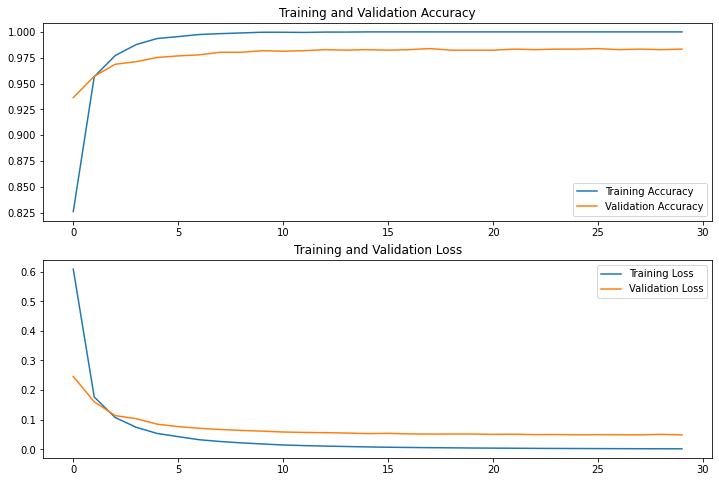

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(len(acc))
plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.subplot(2, 1, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/Tesis/imageClassificationWeights/originalData/Resnet/resnet_retail.h5')

In [ ]:
test_loss,test_acc = model.evaluate(test_ds,verbose=2)
print("Test accuracy:",test_acc)

63/63 - 308s - loss: 0.0663 - accuracy: 0.9794 - 308s/epoch - 5s/step
Test accuracy: 0.9794279932975769


In [ ]:
#model = tf.keras.models.load_model("/content/drive/MyDrive/Tesis/imageClassificationWeights/Resnet/resnet_retail.h5")
# preds = list(model.predict(test_ds))
# preds = [list(preds[i]).index(max(preds[i])) for i in range(len(preds))]
# preds

cwd = os.getcwd()
dir = os.path.join(cwd,"images")
preds = []
labels = []
for sub_dir in os.listdir(test_dir):
  for img_name in os.listdir(os.path.join(test_dir,sub_dir)):
    img_dir = os.path.join(test_dir,sub_dir,img_name)
    #print(img_dir)
    img = tf.keras.utils.load_img(img_dir, target_size=(img_height, img_width))
    img = tf.keras.utils.img_to_array(img)
    img = tf.expand_dims(img, 0)
    #img = preprocess_input(img)
    pred = model.predict(img)
    labels.append(int(sub_dir)-1)
    pred = list(pred[0])
    #print(pred)
    #break
    preds.append(int(test_ds.class_names[np.argmax(pred)])-1)
    
    assert 0 <= preds[-1] <= num_classes-1
    

    
    #print(pred)
    #break
  #break

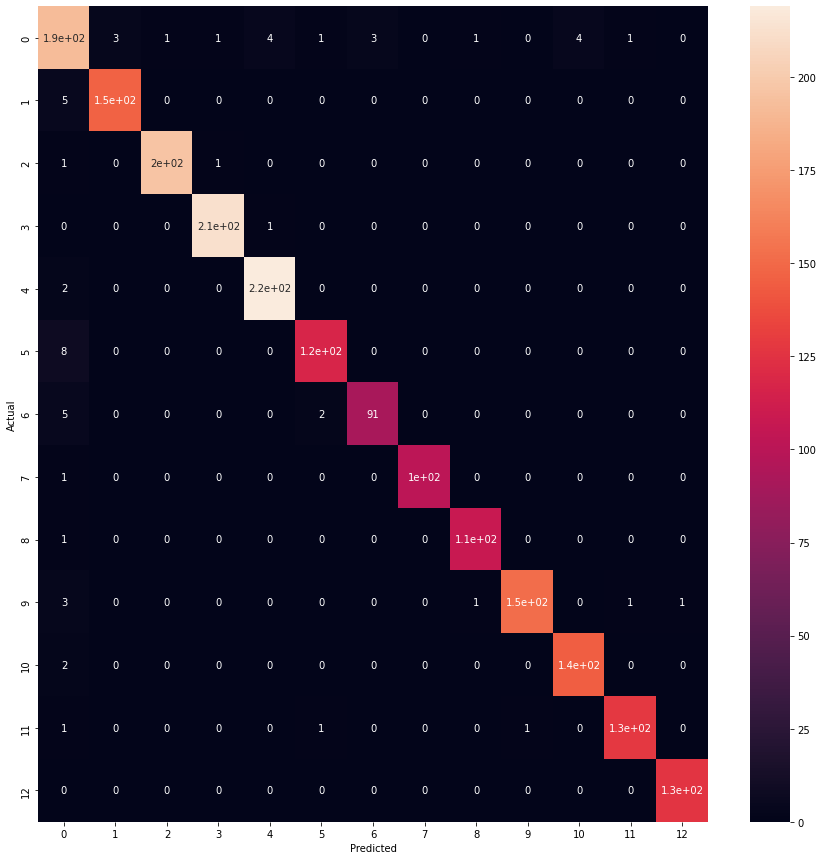

In [ ]:
from sklearn.metrics import confusion_matrix

assert len(labels) == len(preds)
conf_matrix = confusion_matrix(labels,preds)#tf.math.confusion_matrix(labels=labels, predictions=preds, num_classes=num_classes)
#conf_matrix
plt.figure(figsize=(15, 15))
conf_matrix = pd.crosstab(np.array(labels), np.array(preds), rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(conf_matrix, annot=True)

plt.show()

In [ ]:
#https://towardsdatascience.com/confusion-matrix-for-your-multi-class-machine-learning-model-ff9aa3bf7826
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.5f}\n'.format(accuracy_score(labels, preds)))

print('Micro Precision: {:.5f}'.format(precision_score(labels, preds, average='micro')))
print('Micro Recall: {:.5f}'.format(recall_score(labels, preds, average='micro')))
print('Micro F1-score: {:.5f}\n'.format(f1_score(labels, preds, average='micro')))

print('Macro Precision: {:.5f}'.format(precision_score(labels, preds, average='macro')))
print('Macro Recall: {:.5f}'.format(recall_score(labels, preds, average='macro')))
print('Macro F1-score: {:.5f}\n'.format(f1_score(labels, preds, average='macro')))

print('Weighted Precision: {:.5f}'.format(precision_score(labels, preds, average='weighted')))
print('Weighted Recall: {:.5f}'.format(recall_score(labels, preds, average='weighted')))
print('Weighted F1-score: {:.5f}'.format(f1_score(labels, preds, average='weighted')))


Accuracy: 0.97140

Micro Precision: 0.97140
Micro Recall: 0.97140
Micro F1-score: 0.97140

Macro Precision: 0.97481
Macro Recall: 0.97114
Macro F1-score: 0.97285

Weighted Precision: 0.97196
Weighted Recall: 0.97140
Weighted F1-score: 0.97156


In [ ]:
from sklearn.metrics import classification_report
report = classification_report(labels, preds, target_names=['Class {0}'.format(i+1) for i in range(num_classes)])
print(report)

              precision    recall  f1-score   support

     Class 1       0.87      0.91      0.89       211
     Class 2       0.98      0.97      0.97       152
     Class 3       0.99      0.99      0.99       198
     Class 4       0.99      1.00      0.99       214
     Class 5       0.98      0.99      0.98       221
     Class 6       0.97      0.94      0.95       126
     Class 7       0.97      0.93      0.95        98
     Class 8       1.00      0.99      1.00       102
     Class 9       0.98      0.99      0.99       109
    Class 10       0.99      0.96      0.98       158
    Class 11       0.97      0.99      0.98       147
    Class 12       0.98      0.98      0.98       131
    Class 13       0.99      1.00      1.00       126

    accuracy                           0.97      1993
   macro avg       0.97      0.97      0.97      1993
weighted avg       0.97      0.97      0.97      1993



# Tuning

## Resnet

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [ ]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp

In [ ]:
HP_LEARNING_RATE= hp.HParam('learning_rate', hp.Discrete( [0.001, 0.0005,0.0001]))#0.001, 0.0005,
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete([ 'sgd','rmsprop','adam']))
HP_EPOCHS = hp.HParam('epochs',hp.Discrete([5,10,15]))#You should set the number of epochs as high as possible and terminate training based on the error rates. Just mo be clear, an epoch is one learning cycle where the learner sees the whole training data set. If you have two batches, the learner needs to go through two iterations for one epoch.
#min_delta 

METRIC_ACCURACY = 'accuracy'
log_dir = 'logs/hparam_tuning'
with tf.summary.create_file_writer(log_dir).as_default():
  hp.hparams_config(
    hparams=[HP_LEARNING_RATE, HP_OPTIMIZER,HP_EPOCHS],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [ ]:
def plot_history(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs_range = range(len(acc))
  plt.figure(figsize=(12, 8))
  plt.subplot(2, 1, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')
  plt.subplot(2, 1, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.show()

def train_test_model(hparams,run):
  resnet = ResNet50(include_top=False,weights='imagenet',input_shape=(img_height,img_width,3))

  resnet.trainable = False
  inputs = tf.keras.Input(shape=(img_height,img_width,3))
  x = resnet(inputs,training=False)
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  outputs = tf.keras.layers.Dense(num_classes,activation='softmax')(x)
  model = tf.keras.Model(inputs,outputs)
  #set HP
  optimizer = hparams[HP_OPTIMIZER]
  learning_rate = hparams[HP_LEARNING_RATE]
  epochs = hparams[HP_EPOCHS]
  if optimizer == "adam":
      optimizer = tf.optimizers.Adam(learning_rate=learning_rate)
  elif optimizer == "sgd":
      optimizer = tf.optimizers.SGD(learning_rate=learning_rate)
  elif optimizer=='rmsprop':
      optimizer = tf.optimizers.RMSprop(learning_rate=learning_rate)
  else:
      raise ValueError("unexpected optimizer name")

  model.compile(optimizer=optimizer,loss='sparse_categorical_crossentropy',metrics=['accuracy'])
  history = model.fit(train_ds,epochs=epochs,validation_data=val_ds)
            #callbacks=[
        #tf.keras.callbacks.TensorBoard(log_dir),  # log metrics
       # hp.KerasCallback(log_dir, hparams),# log hparams
       # ])
  plot_history(history)
  test_loss,test_acc = model.evaluate(test_ds,verbose=2)
  model.save('content/resnet_retail_filters_object_midbalanced_run{0}.h5'.format(run))
  return test_acc


  

In [ ]:
def run(run_dir, hparams,run):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams,run)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)

In [ ]:
session_num = 0

for learning_rate in HP_LEARNING_RATE.domain.values:
  for optimizer in HP_OPTIMIZER.domain.values:
    for epochs in HP_EPOCHS.domain.values:
      hparams = {
          HP_LEARNING_RATE:learning_rate,
          HP_OPTIMIZER:optimizer,
          HP_EPOCHS:epochs

      }
      run_name = "run-%d" % session_num
      print('--- Starting trial: %s' % run_name)
      print({h.name: hparams[h] for h in hparams})
      #run(log_dir+"/" + run_name, hparams)
      session_num += 1


--- Starting trial: run-0
{'learning_rate': 0.0001, 'optimizer': 'adam', 'epochs': 5}


TypeError: ignored

In [ ]:

hparams = {}
session_num = 0
HPARAMS = [HP_LEARNING_RATE, HP_OPTIMIZER,HP_EPOCHS]
HPARAMS_type = ["D","D","D"]
def grid_search(N):
  global hparams,session_num,HPARAMS,HPARAMS_type
  if(N == 0):
    run_name = "run-%d" % session_num
    print('--- Starting trial: %s' % run_name)
    print({h.name: hparams[h] for h in hparams})
    #run(log_dir+"/" + run_name, hparams,session_num)
    session_num += 1
  else:
    values = []
    if HPARAMS_type[N-1] == 'D':#if discrete
      values = HPARAMS[N-1].domain.values
    elif HPARAMS_type[N-1] == 'RI':#if real interval
      values = [HPARAMS[N-1].domain.min_value,HPARAMS[N-1].domain.max_value]
    for hparam in values:
        hparams[HPARAMS[N-1]] = hparam
        grid_search(N-1)
    

In [ ]:
grid_search(len(HPARAMS))

--- Starting trial: run-0
{'epochs': 5, 'optimizer': 'adam', 'learning_rate': 0.0001}
--- Starting trial: run-1
{'epochs': 5, 'optimizer': 'adam', 'learning_rate': 0.0005}
--- Starting trial: run-2
{'epochs': 5, 'optimizer': 'adam', 'learning_rate': 0.001}
--- Starting trial: run-3
{'epochs': 5, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
--- Starting trial: run-4
{'epochs': 5, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
--- Starting trial: run-5
{'epochs': 5, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
--- Starting trial: run-6
{'epochs': 5, 'optimizer': 'sgd', 'learning_rate': 0.0001}
--- Starting trial: run-7
{'epochs': 5, 'optimizer': 'sgd', 'learning_rate': 0.0005}
--- Starting trial: run-8
{'epochs': 5, 'optimizer': 'sgd', 'learning_rate': 0.001}
--- Starting trial: run-9
{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.0001}
--- Starting trial: run-10
{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.0005}
--- Starting trial: run-11
{'epochs': 10, 'optim

--- Starting trial: run-0
{'epochs': 5, 'optimizer': 'adam', 'learning_rate': 0.0001}
94781440/94765736 [==============================] - 0s 0us/step
Epoch 1/5
186/186 [==============================] - 1324s 7s/step - loss: 1.8642 - accuracy: 0.4340 - val_loss: 1.1747 - val_accuracy: 0.6724
Epoch 2/5
186/186 [==============================] - 1211s 7s/step - loss: 0.9082 - accuracy: 0.7675 - val_loss: 0.7357 - val_accuracy: 0.8251
Epoch 3/5
186/186 [==============================] - 1207s 6s/step - loss: 0.6142 - accuracy: 0.8606 - val_loss: 0.5453 - val_accuracy: 0.8787
Epoch 4/5
186/186 [==============================] - 1210s 7s/step - loss: 0.4697 - accuracy: 0.8971 - val_loss: 0.4387 - val_accuracy: 0.9029
Epoch 5/5
186/186 [==============================] - 1219s 7s/step - loss: 0.3840 - accuracy: 0.9166 - val_loss: 0.3706 - val_accuracy: 0.9130


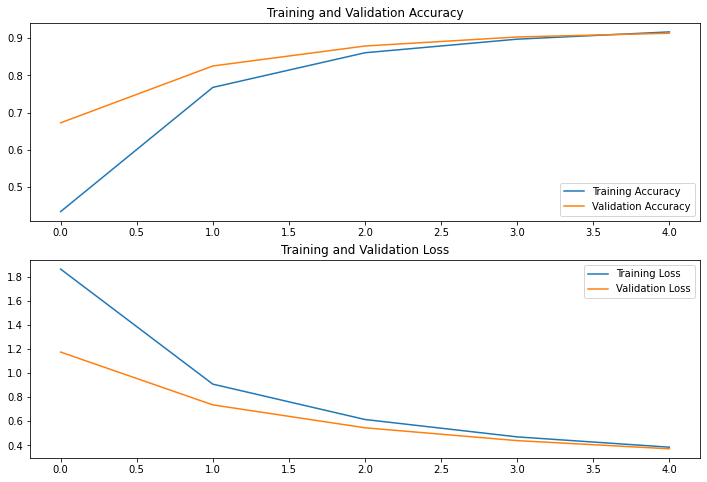

63/63 - 358s - loss: 0.4040 - accuracy: 0.8961 - 358s/epoch - 6s/step
CPU times: user 3h 20min 46s, sys: 3min 14s, total: 3h 24min 1s
Wall time: 1h 49min 40s


In [ ]:
%%time
session_num = 0
hparams = {HP_EPOCHS: 5, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE: 0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-1
{'epochs': 5, 'optimizer': 'adam', 'learning_rate': 0.0005}
Epoch 1/5
186/186 [==============================] - 1219s 7s/step - loss: 0.9483 - accuracy: 0.7312 - val_loss: 0.3725 - val_accuracy: 0.9100
Epoch 2/5
186/186 [==============================] - 1227s 7s/step - loss: 0.2910 - accuracy: 0.9300 - val_loss: 0.2250 - val_accuracy: 0.9479
Epoch 3/5
186/186 [==============================] - 1223s 7s/step - loss: 0.1902 - accuracy: 0.9576 - val_loss: 0.1782 - val_accuracy: 0.9555
Epoch 4/5
186/186 [==============================] - 1213s 7s/step - loss: 0.1399 - accuracy: 0.9704 - val_loss: 0.1414 - val_accuracy: 0.9646
Epoch 5/5
186/186 [==============================] - 1210s 7s/step - loss: 0.1096 - accuracy: 0.9788 - val_loss: 0.1255 - val_accuracy: 0.9646


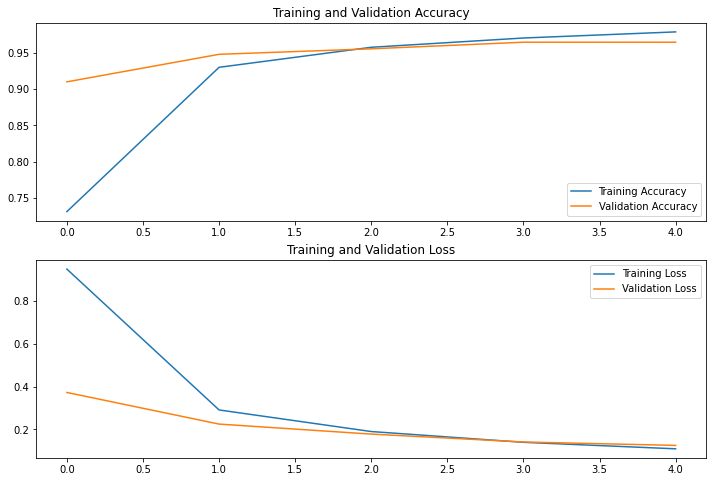

63/63 - 304s - loss: 0.1474 - accuracy: 0.9584 - 304s/epoch - 5s/step
CPU times: user 3h 20min 32s, sys: 3min 45s, total: 3h 24min 18s
Wall time: 1h 48min 9s


In [ ]:
%%time
hparams = {HP_EPOCHS: 5, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE: 0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-2
{'epochs': 5, 'optimizer': 'adam', 'learning_rate': 0.001}
Epoch 1/5
186/186 [==============================] - 1215s 7s/step - loss: 0.6345 - accuracy: 0.8145 - val_loss: 0.2563 - val_accuracy: 0.9257
Epoch 2/5
186/186 [==============================] - 1206s 6s/step - loss: 0.1831 - accuracy: 0.9536 - val_loss: 0.1533 - val_accuracy: 0.9606
Epoch 3/5
186/186 [==============================] - 1205s 6s/step - loss: 0.1099 - accuracy: 0.9771 - val_loss: 0.1310 - val_accuracy: 0.9596
Epoch 4/5
186/186 [==============================] - 1204s 6s/step - loss: 0.0775 - accuracy: 0.9847 - val_loss: 0.0994 - val_accuracy: 0.9747
Epoch 5/5
186/186 [==============================] - 1202s 6s/step - loss: 0.0550 - accuracy: 0.9928 - val_loss: 0.0878 - val_accuracy: 0.9747


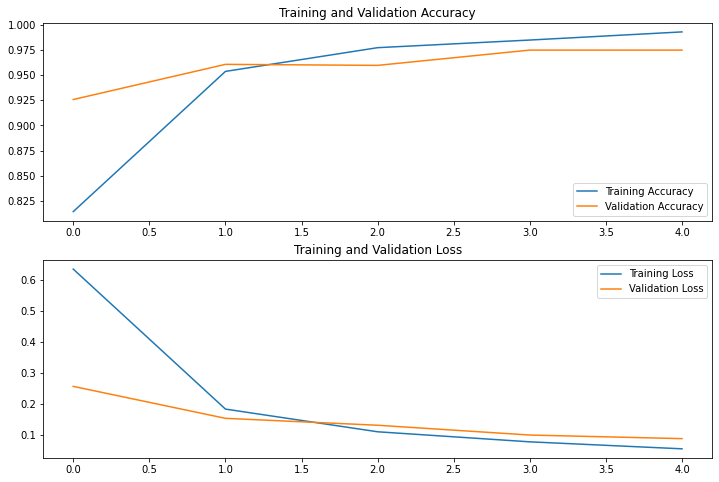

63/63 - 300s - loss: 0.1044 - accuracy: 0.9709 - 300s/epoch - 5s/step
CPU times: user 3h 19min 20s, sys: 3min 37s, total: 3h 22min 58s
Wall time: 1h 46min 17s


In [ ]:
%%time
hparams = {HP_EPOCHS: 5, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE: 0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-3
{'epochs': 5, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
Epoch 1/5
186/186 [==============================] - 1189s 6s/step - loss: 1.6990 - accuracy: 0.4880 - val_loss: 1.0155 - val_accuracy: 0.7336
Epoch 2/5
186/186 [==============================] - 1195s 6s/step - loss: 0.7799 - accuracy: 0.7970 - val_loss: 0.5961 - val_accuracy: 0.8529
Epoch 3/5
186/186 [==============================] - 1195s 6s/step - loss: 0.5062 - accuracy: 0.8759 - val_loss: 0.4286 - val_accuracy: 0.8994
Epoch 4/5
186/186 [==============================] - 1194s 6s/step - loss: 0.3803 - accuracy: 0.9024 - val_loss: 0.3387 - val_accuracy: 0.9191
Epoch 5/5
186/186 [==============================] - 1196s 6s/step - loss: 0.3062 - accuracy: 0.9238 - val_loss: 0.2846 - val_accuracy: 0.9363


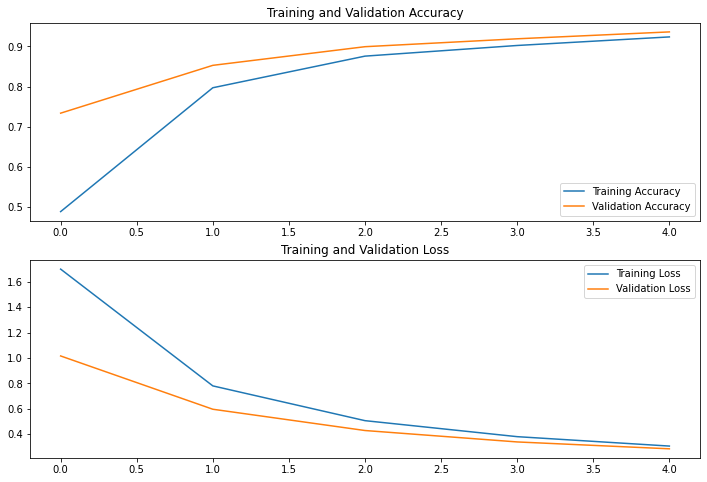

63/63 - 301s - loss: 0.3206 - accuracy: 0.9107 - 301s/epoch - 5s/step
CPU times: user 3h 18min 1s, sys: 3min 22s, total: 3h 21min 24s
Wall time: 1h 46min 29s


In [ ]:
%%time
hparams = {HP_EPOCHS: 5, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE: 0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-4
{'epochs': 5, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
Epoch 1/5
186/186 [==============================] - 1235s 7s/step - loss: 0.7949 - accuracy: 0.7786 - val_loss: 0.3241 - val_accuracy: 0.9166
Epoch 2/5
186/186 [==============================] - 1212s 7s/step - loss: 0.2417 - accuracy: 0.9336 - val_loss: 0.2042 - val_accuracy: 0.9393
Epoch 3/5
186/186 [==============================] - 1205s 6s/step - loss: 0.1526 - accuracy: 0.9583 - val_loss: 0.1547 - val_accuracy: 0.9550
Epoch 4/5
186/186 [==============================] - 1205s 6s/step - loss: 0.1086 - accuracy: 0.9717 - val_loss: 0.1232 - val_accuracy: 0.9601
Epoch 5/5
186/186 [==============================] - 1203s 6s/step - loss: 0.0815 - accuracy: 0.9817 - val_loss: 0.1078 - val_accuracy: 0.9656


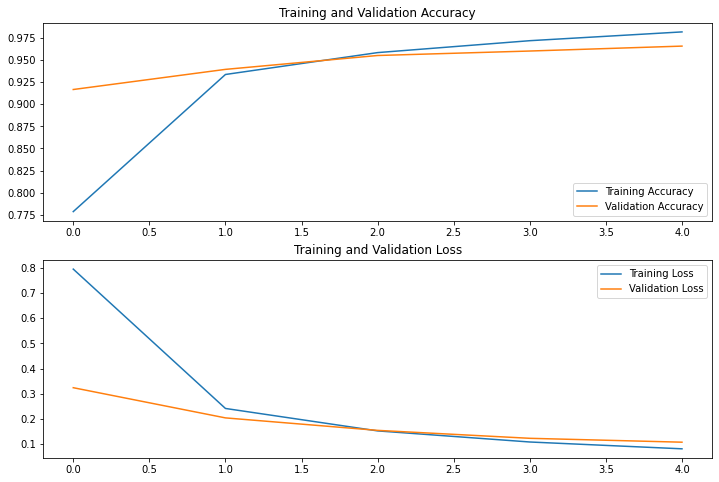

63/63 - 302s - loss: 0.1240 - accuracy: 0.9634 - 302s/epoch - 5s/step
CPU times: user 3h 18min 55s, sys: 3min 41s, total: 3h 22min 36s
Wall time: 1h 47min 27s


In [ ]:
%%time
hparams = {HP_EPOCHS: 5, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE: 0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-5
{'epochs': 5, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
Epoch 1/5
186/186 [==============================] - 1204s 6s/step - loss: 0.5725 - accuracy: 0.8323 - val_loss: 0.2227 - val_accuracy: 0.9363
Epoch 2/5
186/186 [==============================] - 1202s 6s/step - loss: 0.1667 - accuracy: 0.9497 - val_loss: 0.1396 - val_accuracy: 0.9550
Epoch 3/5
186/186 [==============================] - 1202s 6s/step - loss: 0.0964 - accuracy: 0.9728 - val_loss: 0.1096 - val_accuracy: 0.9661
Epoch 4/5
186/186 [==============================] - 1200s 6s/step - loss: 0.0646 - accuracy: 0.9837 - val_loss: 0.0978 - val_accuracy: 0.9687
Epoch 5/5
186/186 [==============================] - 1196s 6s/step - loss: 0.0461 - accuracy: 0.9887 - val_loss: 0.0929 - val_accuracy: 0.9702


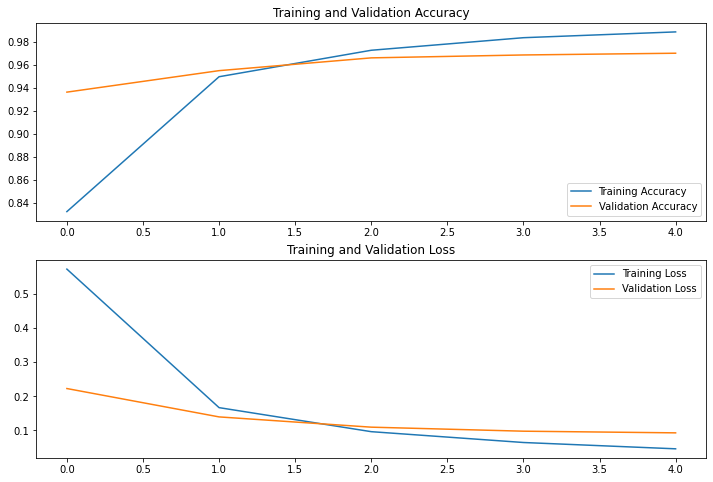

63/63 - 298s - loss: 0.1036 - accuracy: 0.9679 - 298s/epoch - 5s/step
CPU times: user 3h 18min 31s, sys: 3min 28s, total: 3h 22min
Wall time: 1h 47min 18s


In [ ]:
%%time
hparams = {HP_EPOCHS: 5, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE: 0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-6
{'epochs': 5, 'optimizer': 'sgd', 'learning_rate': 0.0001}
Epoch 1/5
186/186 [==============================] - 1225s 7s/step - loss: 2.8867 - accuracy: 0.0888 - val_loss: 2.6981 - val_accuracy: 0.1203
Epoch 2/5
186/186 [==============================] - 1200s 6s/step - loss: 2.5774 - accuracy: 0.1489 - val_loss: 2.4427 - val_accuracy: 0.1769
Epoch 3/5
186/186 [==============================] - 1207s 6s/step - loss: 2.3478 - accuracy: 0.2161 - val_loss: 2.2378 - val_accuracy: 0.2563
Epoch 4/5
186/186 [==============================] - 1205s 6s/step - loss: 2.1587 - accuracy: 0.2834 - val_loss: 2.0662 - val_accuracy: 0.3322
Epoch 5/5
186/186 [==============================] - 1188s 6s/step - loss: 1.9991 - accuracy: 0.3529 - val_loss: 1.9204 - val_accuracy: 0.4019


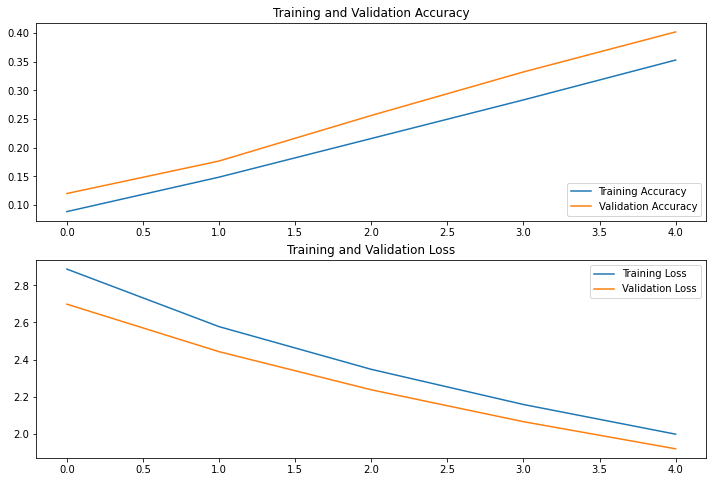

63/63 - 299s - loss: 1.9494 - accuracy: 0.3899 - 299s/epoch - 5s/step
CPU times: user 3h 18min 25s, sys: 2min 58s, total: 3h 21min 23s
Wall time: 1h 47min 7s


In [ ]:
%%time
hparams = {HP_EPOCHS: 5, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-7
{'epochs': 5, 'optimizer': 'sgd', 'learning_rate': 0.0005}
94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/5
186/186 [==============================] - 1464s 8s/step - loss: 2.2936 - accuracy: 0.2451 - val_loss: 1.8413 - val_accuracy: 0.4151
Epoch 2/5
186/186 [==============================] - 1328s 7s/step - loss: 1.5917 - accuracy: 0.5152 - val_loss: 1.3875 - val_accuracy: 0.5900
Epoch 3/5
186/186 [==============================] - 1295s 7s/step - loss: 1.2526 - accuracy: 0.6483 - val_loss: 1.1360 - val_accuracy: 0.6790
Epoch 4/5
186/186 [==============================] - 1322s 7s/step - loss: 1.0503 - accuracy: 0.7129 - val_loss: 0.9738 - val_accuracy: 0.7391
Epoch 5/5
186/186 [==============================] - 1379s 7s/step - loss: 0.9138 - accuracy: 0.7611 - val_loss: 0.8590 - val_accuracy: 0.7776


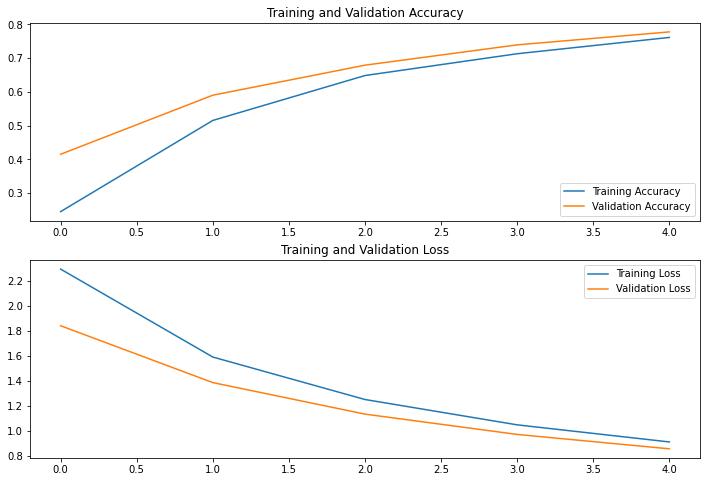

63/63 - 419s - loss: 0.8888 - accuracy: 0.7737 - 419s/epoch - 7s/step
CPU times: user 3h 28min 15s, sys: 9min 1s, total: 3h 37min 16s
Wall time: 2h 59s


In [ ]:
%%time
session_num =7
hparams = {HP_EPOCHS: 5, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-8
{'epochs': 5, 'optimizer': 'sgd', 'learning_rate': 0.001}
Epoch 1/5
186/186 [==============================] - 1344s 7s/step - loss: 2.0435 - accuracy: 0.3462 - val_loss: 1.4035 - val_accuracy: 0.5925
Epoch 2/5
186/186 [==============================] - 1357s 7s/step - loss: 1.1580 - accuracy: 0.6819 - val_loss: 0.9645 - val_accuracy: 0.7604
Epoch 3/5
186/186 [==============================] - 1378s 7s/step - loss: 0.8559 - accuracy: 0.7812 - val_loss: 0.7619 - val_accuracy: 0.8195
Epoch 4/5
186/186 [==============================] - 1352s 7s/step - loss: 0.6994 - accuracy: 0.8328 - val_loss: 0.6432 - val_accuracy: 0.8498
Epoch 5/5
186/186 [==============================] - 1362s 7s/step - loss: 0.6020 - accuracy: 0.8599 - val_loss: 0.5652 - val_accuracy: 0.8665


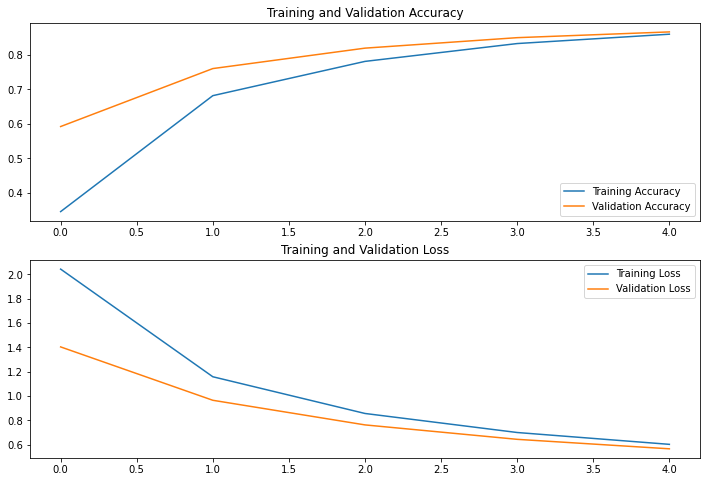

63/63 - 357s - loss: 0.5932 - accuracy: 0.8530 - 357s/epoch - 6s/step
CPU times: user 3h 28min 31s, sys: 12min 22s, total: 3h 40min 53s
Wall time: 2h 1min 54s


In [ ]:
%%time
hparams = {HP_EPOCHS: 5, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

In [ ]:
!zip -r 'logs.zip' '/content/logs'

--- Starting trial: run-9
{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.0001}
Epoch 1/10
186/186 [==============================] - 1414s 8s/step - loss: 1.9977 - accuracy: 0.3958 - val_loss: 1.2362 - val_accuracy: 0.6496
Epoch 2/10
186/186 [==============================] - 1371s 7s/step - loss: 0.9420 - accuracy: 0.7685 - val_loss: 0.7481 - val_accuracy: 0.8241
Epoch 3/10
186/186 [==============================] - 1377s 7s/step - loss: 0.6263 - accuracy: 0.8590 - val_loss: 0.5490 - val_accuracy: 0.8721
Epoch 4/10
186/186 [==============================] - 1390s 7s/step - loss: 0.4771 - accuracy: 0.8908 - val_loss: 0.4412 - val_accuracy: 0.8984
Epoch 5/10
186/186 [==============================] - 1347s 7s/step - loss: 0.3894 - accuracy: 0.9146 - val_loss: 0.3721 - val_accuracy: 0.9095
Epoch 6/10
186/186 [==============================] - 1387s 7s/step - loss: 0.3307 - accuracy: 0.9270 - val_loss: 0.3253 - val_accuracy: 0.9221
Epoch 7/10
186/186 [=============================

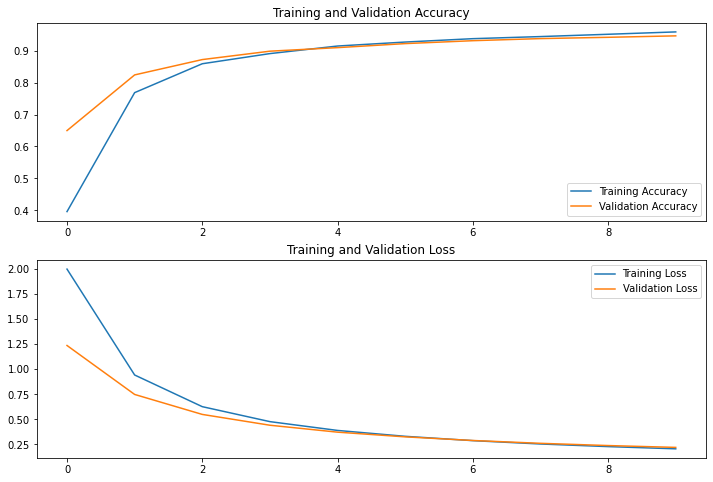

63/63 - 345s - loss: 0.2396 - accuracy: 0.9378 - 345s/epoch - 5s/step
CPU times: user 6h 46min 58s, sys: 27min 53s, total: 7h 14min 51s
Wall time: 3h 59min 57s


In [ ]:
%%time
hparams = {HP_EPOCHS: 10, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1
#--- Starting trial: run-9
#{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.0001}

--- Starting trial: run-10
{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.0005}
94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/10
186/186 [==============================] - 1425s 7s/step - loss: 0.9024 - accuracy: 0.7398 - val_loss: 0.3678 - val_accuracy: 0.9055
Epoch 2/10
186/186 [==============================] - 1197s 6s/step - loss: 0.2816 - accuracy: 0.9341 - val_loss: 0.2368 - val_accuracy: 0.9363
Epoch 3/10
186/186 [==============================] - 1194s 6s/step - loss: 0.1845 - accuracy: 0.9596 - val_loss: 0.1849 - val_accuracy: 0.9510
Epoch 4/10
186/186 [==============================] - 1196s 6s/step - loss: 0.1354 - accuracy: 0.9743 - val_loss: 0.1465 - val_accuracy: 0.9590
Epoch 5/10
186/186 [==============================] - 1197s 6s/step - loss: 0.1060 - accuracy: 0.9807 - val_loss: 0.1262 - val_accuracy: 0.9646
Epoch 6/10
186/186 [==============================] - 1203s 6s/step - loss: 0.0848 - accuracy: 0.9870 - val_loss: 0.1149 - val_

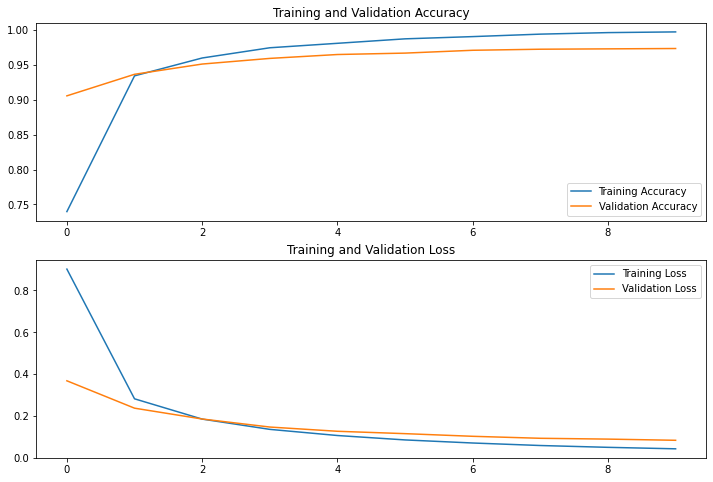

63/63 - 387s - loss: 0.1008 - accuracy: 0.9714 - 387s/epoch - 6s/step
CPU times: user 6h 30min 35s, sys: 4min 18s, total: 6h 34min 53s
Wall time: 3h 33min 8s


In [ ]:
%%time
session_num=10
hparams = {HP_EPOCHS: 10, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1
#--- Starting trial: run-10
#{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.0005}

--- Starting trial: run-11
{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.001}
Epoch 1/10
186/186 [==============================] - 1199s 6s/step - loss: 0.6250 - accuracy: 0.8246 - val_loss: 0.2366 - val_accuracy: 0.9388
Epoch 2/10
186/186 [==============================] - 1196s 6s/step - loss: 0.1770 - accuracy: 0.9578 - val_loss: 0.1744 - val_accuracy: 0.9499
Epoch 3/10
186/186 [==============================] - 1195s 6s/step - loss: 0.1107 - accuracy: 0.9754 - val_loss: 0.1181 - val_accuracy: 0.9712
Epoch 4/10
186/186 [==============================] - 1196s 6s/step - loss: 0.0739 - accuracy: 0.9889 - val_loss: 0.1049 - val_accuracy: 0.9702
Epoch 5/10
186/186 [==============================] - 1196s 6s/step - loss: 0.0552 - accuracy: 0.9923 - val_loss: 0.0871 - val_accuracy: 0.9757
Epoch 6/10
186/186 [==============================] - 1192s 6s/step - loss: 0.0406 - accuracy: 0.9958 - val_loss: 0.0796 - val_accuracy: 0.9767
Epoch 7/10
186/186 [=============================

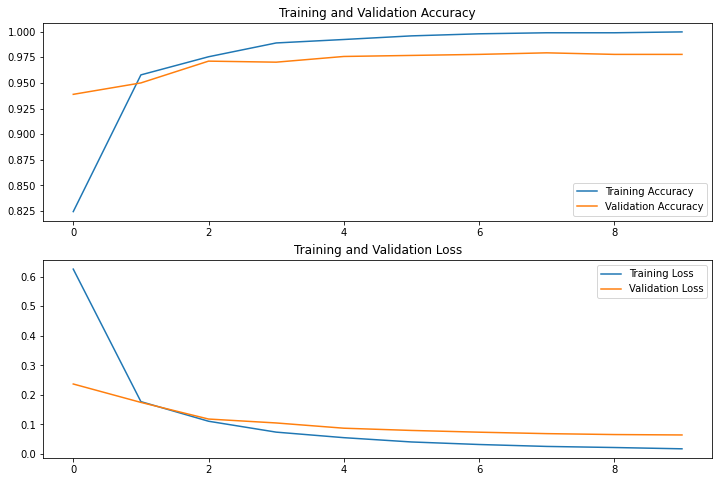

63/63 - 302s - loss: 0.0824 - accuracy: 0.9749 - 302s/epoch - 5s/step
CPU times: user 6h 29min 9s, sys: 4min 37s, total: 6h 33min 47s
Wall time: 3h 27min 46s


In [ ]:
#--- Starting trial: run-11
#{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.001}
%%time
hparams = {HP_EPOCHS: 10, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-12
{'epochs': 10, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
Epoch 1/10
186/186 [==============================] - 1192s 6s/step - loss: 1.7262 - accuracy: 0.4673 - val_loss: 1.0512 - val_accuracy: 0.7083
Epoch 2/10
186/186 [==============================] - 1186s 6s/step - loss: 0.7950 - accuracy: 0.7889 - val_loss: 0.6031 - val_accuracy: 0.8473
Epoch 3/10
186/186 [==============================] - 1186s 6s/step - loss: 0.5068 - accuracy: 0.8755 - val_loss: 0.4237 - val_accuracy: 0.8979
Epoch 4/10
186/186 [==============================] - 1181s 6s/step - loss: 0.3748 - accuracy: 0.9090 - val_loss: 0.3328 - val_accuracy: 0.9216
Epoch 5/10
186/186 [==============================] - 1185s 6s/step - loss: 0.3010 - accuracy: 0.9270 - val_loss: 0.2784 - val_accuracy: 0.9292
Epoch 6/10
186/186 [==============================] - 1186s 6s/step - loss: 0.2533 - accuracy: 0.9379 - val_loss: 0.2424 - val_accuracy: 0.9333
Epoch 7/10
186/186 [=========================

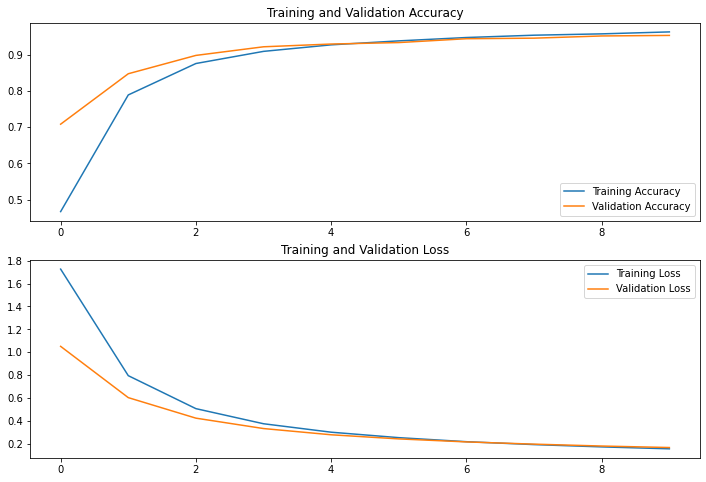

63/63 - 298s - loss: 0.1917 - accuracy: 0.9473 - 298s/epoch - 5s/step
CPU times: user 6h 26min 59s, sys: 3min 53s, total: 6h 30min 53s
Wall time: 3h 26min 47s


In [ ]:
#--- Starting trial: run-12
#{'epochs': 10, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
%%time
hparams = {HP_EPOCHS: 10, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-13
{'epochs': 10, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
Epoch 1/10
186/186 [==============================] - 1191s 6s/step - loss: 0.8204 - accuracy: 0.7669 - val_loss: 0.3251 - val_accuracy: 0.9166
Epoch 2/10
186/186 [==============================] - 1188s 6s/step - loss: 0.2370 - accuracy: 0.9386 - val_loss: 0.1879 - val_accuracy: 0.9489
Epoch 3/10
186/186 [==============================] - 1185s 6s/step - loss: 0.1482 - accuracy: 0.9605 - val_loss: 0.1399 - val_accuracy: 0.9575
Epoch 4/10
186/186 [==============================] - 1183s 6s/step - loss: 0.1046 - accuracy: 0.9726 - val_loss: 0.1304 - val_accuracy: 0.9601
Epoch 5/10
186/186 [==============================] - 1184s 6s/step - loss: 0.0797 - accuracy: 0.9808 - val_loss: 0.1062 - val_accuracy: 0.9666
Epoch 6/10
186/186 [==============================] - 1190s 6s/step - loss: 0.0632 - accuracy: 0.9855 - val_loss: 0.0934 - val_accuracy: 0.9702
Epoch 7/10
186/186 [=========================

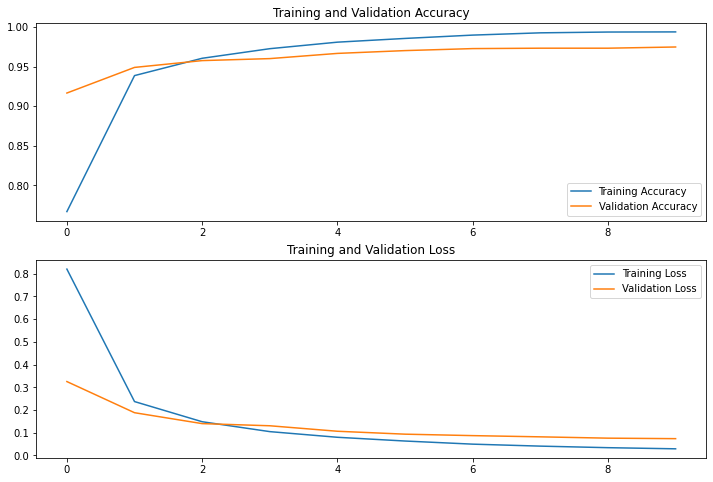

63/63 - 300s - loss: 0.0897 - accuracy: 0.9704 - 300s/epoch - 5s/step
CPU times: user 6h 27min 8s, sys: 4min 12s, total: 6h 31min 20s
Wall time: 3h 27min 21s


In [ ]:
#--- Starting trial: run-13
#{'epochs': 10, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
%%time
hparams = {HP_EPOCHS: 10, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-14
{'epochs': 10, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/10
186/186 [==============================] - 1457s 8s/step - loss: 0.5752 - accuracy: 0.8251 - val_loss: 0.2413 - val_accuracy: 0.9216
Epoch 2/10
186/186 [==============================] - 1239s 7s/step - loss: 0.1685 - accuracy: 0.9479 - val_loss: 0.1489 - val_accuracy: 0.9499
Epoch 3/10
186/186 [==============================] - 1327s 7s/step - loss: 0.0985 - accuracy: 0.9724 - val_loss: 0.1218 - val_accuracy: 0.9606
Epoch 4/10
186/186 [==============================] - 1313s 7s/step - loss: 0.0663 - accuracy: 0.9820 - val_loss: 0.1098 - val_accuracy: 0.9580
Epoch 5/10
186/186 [==============================] - 1304s 7s/step - loss: 0.0463 - accuracy: 0.9881 - val_loss: 0.0949 - val_accuracy: 0.9671
Epoch 6/10
186/186 [==============================] - 1297s 7s/step - loss: 0.0342 - accuracy: 0.9933 - val_loss: 0.0874 - va

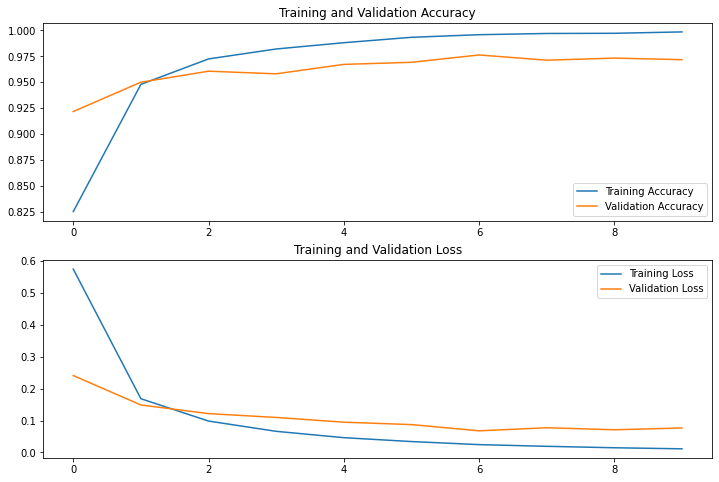

63/63 - 380s - loss: 0.0912 - accuracy: 0.9689 - 380s/epoch - 6s/step
CPU times: user 6h 40min 49s, sys: 14min 18s, total: 6h 55min 7s
Wall time: 3h 49min 33s


In [ ]:
#--- Starting trial: run-14
#{'epochs': 10, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
%%time
session_num=14
hparams = {HP_EPOCHS: 10, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-15
{'epochs': 10, 'optimizer': 'sgd', 'learning_rate': 0.0001}
Epoch 1/10
186/186 [==============================] - 1262s 7s/step - loss: 2.8605 - accuracy: 0.1140 - val_loss: 2.6558 - val_accuracy: 0.1274
Epoch 2/10
186/186 [==============================] - 1243s 7s/step - loss: 2.5081 - accuracy: 0.1849 - val_loss: 2.3907 - val_accuracy: 0.2245
Epoch 3/10
186/186 [==============================] - 1249s 7s/step - loss: 2.2829 - accuracy: 0.2641 - val_loss: 2.1945 - val_accuracy: 0.2958
Epoch 4/10
186/186 [==============================] - 1257s 7s/step - loss: 2.1025 - accuracy: 0.3314 - val_loss: 2.0291 - val_accuracy: 0.3554
Epoch 5/10
186/186 [==============================] - 1252s 7s/step - loss: 1.9486 - accuracy: 0.3936 - val_loss: 1.8871 - val_accuracy: 0.4029
Epoch 6/10
186/186 [==============================] - 1250s 7s/step - loss: 1.8161 - accuracy: 0.4466 - val_loss: 1.7648 - val_accuracy: 0.4525
Epoch 7/10
186/186 [=============================

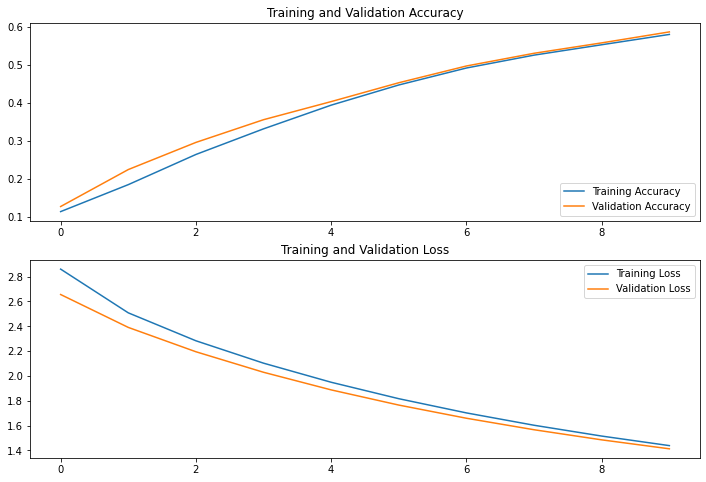

63/63 - 318s - loss: 1.4339 - accuracy: 0.5810 - 318s/epoch - 5s/step
CPU times: user 6h 34min 6s, sys: 11min 55s, total: 6h 46min 2s
Wall time: 3h 37min 8s


In [ ]:
#--- Starting trial: run-15
#{'epochs': 10, 'optimizer': 'sgd', 'learning_rate': 0.0001}
%%time
hparams = {HP_EPOCHS: 10, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-16
{'epochs': 10, 'optimizer': 'sgd', 'learning_rate': 0.0005}
Epoch 1/10
186/186 [==============================] - 1365s 7s/step - loss: 2.3966 - accuracy: 0.2178 - val_loss: 1.9137 - val_accuracy: 0.3943
Epoch 2/10
186/186 [==============================] - 1491s 8s/step - loss: 1.6443 - accuracy: 0.5048 - val_loss: 1.4279 - val_accuracy: 0.5849
Epoch 3/10
186/186 [==============================] - 1548s 8s/step - loss: 1.2782 - accuracy: 0.6469 - val_loss: 1.1567 - val_accuracy: 0.6926
Epoch 4/10
186/186 [==============================] - 1585s 9s/step - loss: 1.0605 - accuracy: 0.7231 - val_loss: 0.9837 - val_accuracy: 0.7497
Epoch 5/10
186/186 [==============================] - 1583s 9s/step - loss: 0.9162 - accuracy: 0.7647 - val_loss: 0.8637 - val_accuracy: 0.7846
Epoch 6/10
186/186 [==============================] - 1578s 8s/step - loss: 0.8135 - accuracy: 0.7956 - val_loss: 0.7752 - val_accuracy: 0.8089
Epoch 7/10
186/186 [=============================

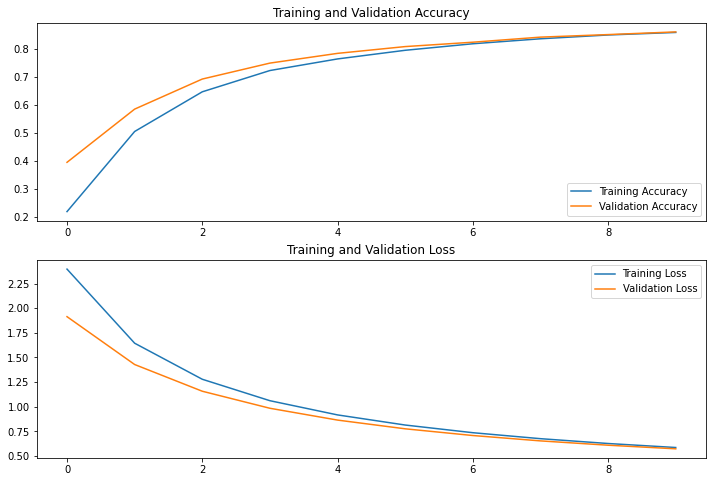

63/63 - 354s - loss: 0.6077 - accuracy: 0.8470 - 354s/epoch - 6s/step
CPU times: user 6h 49min 22s, sys: 46min 34s, total: 7h 35min 56s
Wall time: 4h 20min 1s


In [ ]:
#--- Starting trial: run-16
#{'epochs': 10, 'optimizer': 'sgd', 'learning_rate': 0.0005}
%%time
hparams = {HP_EPOCHS: 10, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-17
{'epochs': 10, 'optimizer': 'sgd', 'learning_rate': 0.001}
94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/10
186/186 [==============================] - 2832s 15s/step - loss: 1.9492 - accuracy: 0.3870 - val_loss: 1.3672 - val_accuracy: 0.6143
Epoch 2/10
186/186 [==============================] - 964s 5s/step - loss: 1.1357 - accuracy: 0.6920 - val_loss: 0.9523 - val_accuracy: 0.7543
Epoch 3/10
186/186 [==============================] - 962s 5s/step - loss: 0.8477 - accuracy: 0.7921 - val_loss: 0.7544 - val_accuracy: 0.8180
Epoch 4/10
186/186 [==============================] - 990s 5s/step - loss: 0.6949 - accuracy: 0.8353 - val_loss: 0.6387 - val_accuracy: 0.8514
Epoch 5/10
186/186 [==============================] - 973s 5s/step - loss: 0.5993 - accuracy: 0.8602 - val_loss: 0.5617 - val_accuracy: 0.8701
Epoch 6/10
186/186 [==============================] - 968s 5s/step - loss: 0.5330 - accuracy: 0.8767 - val_loss: 0.5070 - val_accura

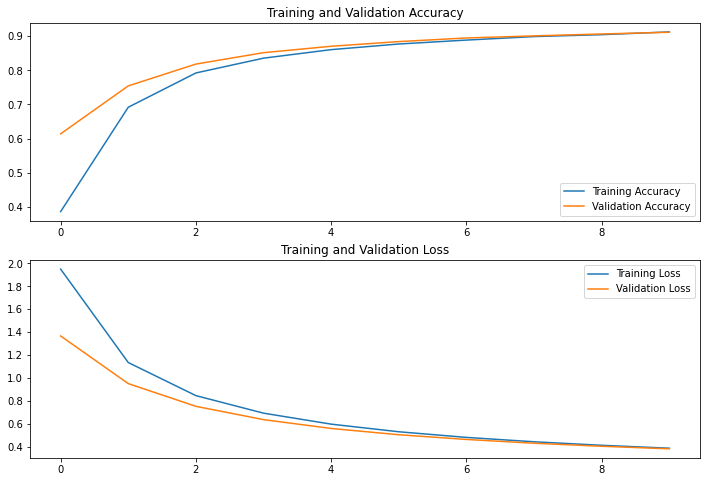

63/63 - 738s - loss: 0.4253 - accuracy: 0.8881 - 738s/epoch - 12s/step
CPU times: user 5h 13min 33s, sys: 5min 7s, total: 5h 18min 41s
Wall time: 3h 26min 52s


In [ ]:
#--- Starting trial: run-17
#{'epochs': 10, 'optimizer': 'sgd', 'learning_rate': 0.001}
%%time
session_num=17
hparams = {HP_EPOCHS: 10, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1


--- Starting trial: run-18
{'epochs': 15, 'optimizer': 'adam', 'learning_rate': 0.0001}
Epoch 1/15
186/186 [==============================] - 976s 5s/step - loss: 1.9314 - accuracy: 0.4052 - val_loss: 1.1671 - val_accuracy: 0.6977
Epoch 2/15
186/186 [==============================] - 1045s 6s/step - loss: 0.8972 - accuracy: 0.7805 - val_loss: 0.7074 - val_accuracy: 0.8407
Epoch 3/15
186/186 [==============================] - 1027s 6s/step - loss: 0.6010 - accuracy: 0.8658 - val_loss: 0.5212 - val_accuracy: 0.8862
Epoch 4/15
186/186 [==============================] - 997s 5s/step - loss: 0.4611 - accuracy: 0.9004 - val_loss: 0.4194 - val_accuracy: 0.9100
Epoch 5/15
186/186 [==============================] - 985s 5s/step - loss: 0.3780 - accuracy: 0.9166 - val_loss: 0.3559 - val_accuracy: 0.9206
Epoch 6/15
186/186 [==============================] - 979s 5s/step - loss: 0.3219 - accuracy: 0.9283 - val_loss: 0.3099 - val_accuracy: 0.9287
Epoch 7/15
186/186 [==============================] 

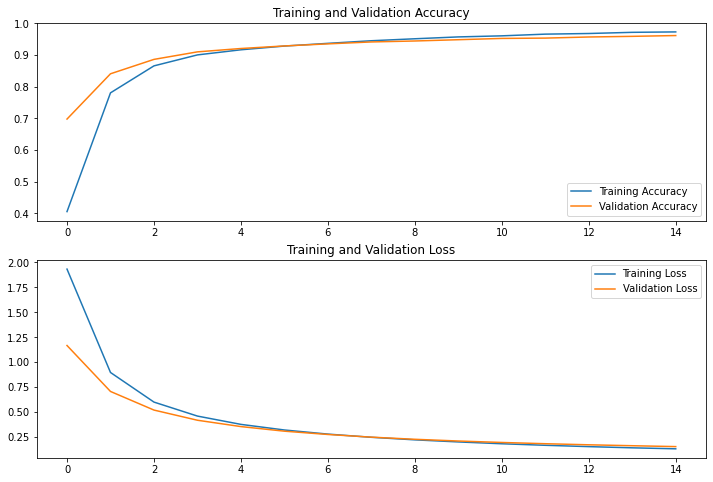

63/63 - 250s - loss: 0.1754 - accuracy: 0.9533 - 250s/epoch - 4s/step
CPU times: user 8h 2min 49s, sys: 7min 41s, total: 8h 10min 31s
Wall time: 4h 19min 53s


In [ ]:
#--- Starting trial: run-18
#{'epochs': 15, 'optimizer': 'adam', 'learning_rate': 0.0001}
%%time
hparams = {HP_EPOCHS: 15, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1


--- Starting trial: run-19
{'epochs': 15, 'optimizer': 'adam', 'learning_rate': 0.0005}
Epoch 1/15
186/186 [==============================] - 1023s 5s/step - loss: 0.9017 - accuracy: 0.7369 - val_loss: 0.3694 - val_accuracy: 0.9125
Epoch 2/15
186/186 [==============================] - 1001s 5s/step - loss: 0.2864 - accuracy: 0.9320 - val_loss: 0.2342 - val_accuracy: 0.9429
Epoch 3/15
186/186 [==============================] - 1001s 5s/step - loss: 0.1887 - accuracy: 0.9569 - val_loss: 0.1871 - val_accuracy: 0.9489
Epoch 4/15
186/186 [==============================] - 997s 5s/step - loss: 0.1396 - accuracy: 0.9699 - val_loss: 0.1512 - val_accuracy: 0.9601
Epoch 5/15
186/186 [==============================] - 1001s 5s/step - loss: 0.1064 - accuracy: 0.9785 - val_loss: 0.1283 - val_accuracy: 0.9656
Epoch 6/15
186/186 [==============================] - 1014s 5s/step - loss: 0.0865 - accuracy: 0.9854 - val_loss: 0.1181 - val_accuracy: 0.9671
Epoch 7/15
186/186 [=============================

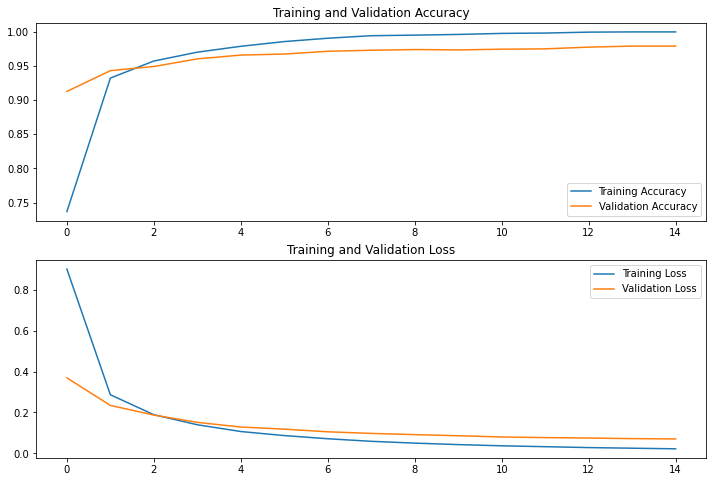

63/63 - 253s - loss: 0.0852 - accuracy: 0.9749 - 253s/epoch - 4s/step
CPU times: user 8h 14min 47s, sys: 9min 34s, total: 8h 24min 22s
Wall time: 4h 26min 58s


In [ ]:

#--- Starting trial: run-19
#{'epochs': 15, 'optimizer': 'adam', 'learning_rate': 0.0005}
%%time
hparams = {HP_EPOCHS: 15, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1



--- Starting trial: run-20
{'epochs': 15, 'optimizer': 'adam', 'learning_rate': 0.001}
94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/15
186/186 [==============================] - 1307s 7s/step - loss: 0.6611 - accuracy: 0.8054 - val_loss: 0.2399 - val_accuracy: 0.9403
Epoch 2/15
186/186 [==============================] - 1256s 7s/step - loss: 0.1881 - accuracy: 0.9512 - val_loss: 0.1660 - val_accuracy: 0.9540
Epoch 3/15
186/186 [==============================] - 1248s 7s/step - loss: 0.1149 - accuracy: 0.9739 - val_loss: 0.1273 - val_accuracy: 0.9616
Epoch 4/15
186/186 [==============================] - 1248s 7s/step - loss: 0.0785 - accuracy: 0.9860 - val_loss: 0.1015 - val_accuracy: 0.9687
Epoch 5/15
186/186 [==============================] - 1236s 7s/step - loss: 0.0578 - accuracy: 0.9916 - val_loss: 0.0910 - val_accuracy: 0.9707
Epoch 6/15
186/186 [==============================] - 1242s 7s/step - loss: 0.0435 - accuracy: 0.9950 - val_loss: 0.0804 - val_a

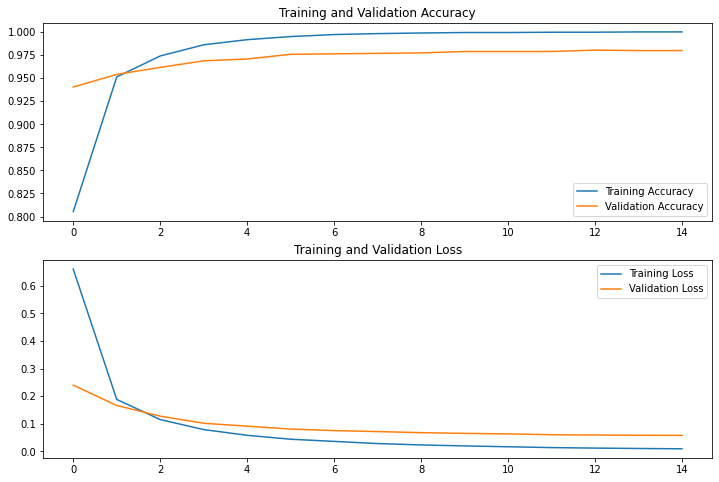

63/63 - 370s - loss: 0.0751 - accuracy: 0.9779 - 370s/epoch - 6s/step
CPU times: user 9h 58min 6s, sys: 13min 33s, total: 10h 11min 39s
Wall time: 5h 29min 36s


In [ ]:
#--- Starting trial: run-20
#{'epochs': 15, 'optimizer': 'adam', 'learning_rate': 0.001}
%%time
session_num = 20
hparams = {HP_EPOCHS: 15, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-21
{'epochs': 15, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
Epoch 1/15
186/186 [==============================] - 1292s 7s/step - loss: 1.8038 - accuracy: 0.4415 - val_loss: 1.0648 - val_accuracy: 0.7169
Epoch 2/15
186/186 [==============================] - 1289s 7s/step - loss: 0.7913 - accuracy: 0.7946 - val_loss: 0.5998 - val_accuracy: 0.8640
Epoch 3/15
186/186 [==============================] - 1288s 7s/step - loss: 0.5023 - accuracy: 0.8757 - val_loss: 0.4244 - val_accuracy: 0.9019
Epoch 4/15
186/186 [==============================] - 1284s 7s/step - loss: 0.3749 - accuracy: 0.9061 - val_loss: 0.3362 - val_accuracy: 0.9201
Epoch 5/15
186/186 [==============================] - 1289s 7s/step - loss: 0.3020 - accuracy: 0.9268 - val_loss: 0.2824 - val_accuracy: 0.9277
Epoch 6/15
186/186 [==============================] - 1288s 7s/step - loss: 0.2551 - accuracy: 0.9352 - val_loss: 0.2448 - val_accuracy: 0.9368
Epoch 7/15
186/186 [=========================

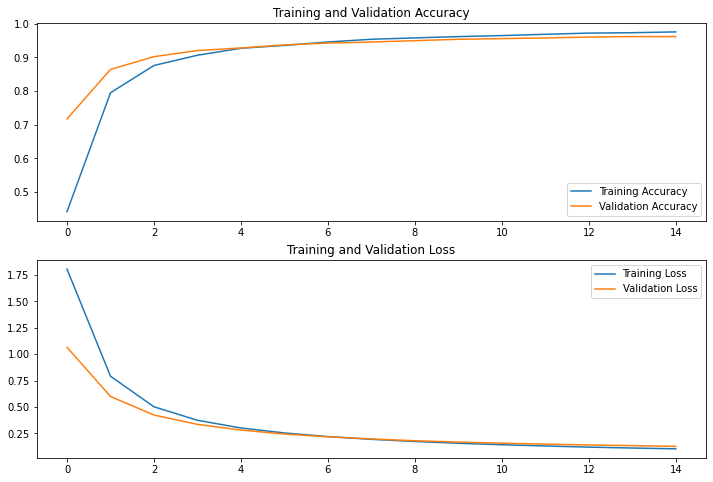

63/63 - 323s - loss: 0.1453 - accuracy: 0.9594 - 323s/epoch - 5s/step
CPU times: user 9h 59min 53s, sys: 19min 33s, total: 10h 19min 27s
Wall time: 5h 37min 57s


In [ ]:
#--- Starting trial: run-21
#{'epochs': 15, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
%%time
hparams = {HP_EPOCHS: 15, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1


--- Starting trial: run-22
{'epochs': 15, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/15
186/186 [==============================] - 1330s 7s/step - loss: 0.7707 - accuracy: 0.7808 - val_loss: 0.3154 - val_accuracy: 0.9100
Epoch 2/15
186/186 [==============================] - 1244s 7s/step - loss: 0.2430 - accuracy: 0.9325 - val_loss: 0.1917 - val_accuracy: 0.9449
Epoch 3/15
186/186 [==============================] - 1250s 7s/step - loss: 0.1527 - accuracy: 0.9563 - val_loss: 0.1426 - val_accuracy: 0.9585
Epoch 4/15
186/186 [==============================] - 1248s 7s/step - loss: 0.1087 - accuracy: 0.9719 - val_loss: 0.1190 - val_accuracy: 0.9616
Epoch 5/15
186/186 [==============================] - 1248s 7s/step - loss: 0.0821 - accuracy: 0.9785 - val_loss: 0.1085 - val_accuracy: 0.9626
Epoch 6/15
186/186 [==============================] - 1290s 7s/step - loss: 0.0646 - accuracy: 0.9854 - val_loss: 0.0953 - v

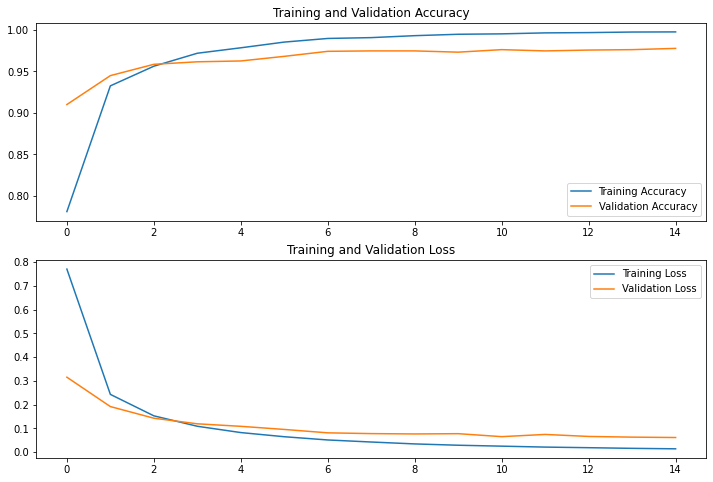

63/63 - 353s - loss: 0.0794 - accuracy: 0.9724 - 353s/epoch - 6s/step
CPU times: user 9h 55min 14s, sys: 9min 31s, total: 10h 4min 46s
Wall time: 5h 25min 7s


In [ ]:

#--- Starting trial: run-22
#{'epochs': 15, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
%%time
session_num = 22
hparams = {HP_EPOCHS: 15, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1



--- Starting trial: run-23
{'epochs': 15, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
Epoch 1/15
186/186 [==============================] - 1245s 7s/step - loss: 0.5906 - accuracy: 0.8249 - val_loss: 0.2328 - val_accuracy: 0.9312
Epoch 2/15
186/186 [==============================] - 1233s 7s/step - loss: 0.1620 - accuracy: 0.9517 - val_loss: 0.1642 - val_accuracy: 0.9484
Epoch 3/15
186/186 [==============================] - 1241s 7s/step - loss: 0.0952 - accuracy: 0.9739 - val_loss: 0.1285 - val_accuracy: 0.9621
Epoch 4/15
186/186 [==============================] - 1247s 7s/step - loss: 0.0622 - accuracy: 0.9842 - val_loss: 0.0928 - val_accuracy: 0.9681
Epoch 5/15
186/186 [==============================] - 1251s 7s/step - loss: 0.0450 - accuracy: 0.9867 - val_loss: 0.0913 - val_accuracy: 0.9681
Epoch 6/15
186/186 [==============================] - 1247s 7s/step - loss: 0.0334 - accuracy: 0.9926 - val_loss: 0.0797 - val_accuracy: 0.9712
Epoch 7/15
186/186 [==========================

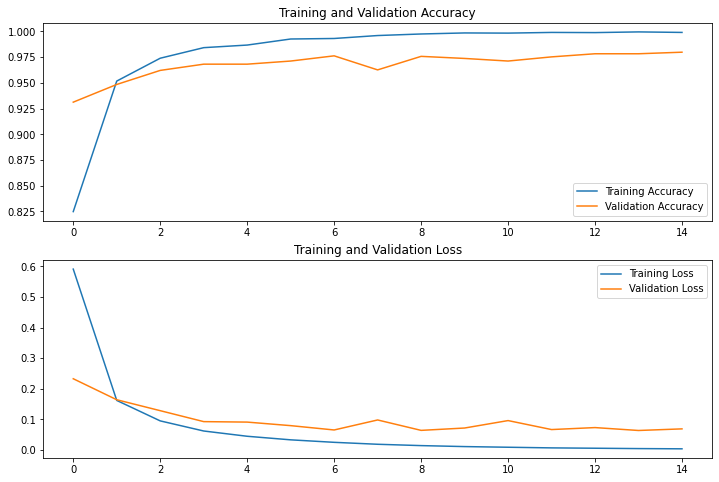

63/63 - 312s - loss: 0.0829 - accuracy: 0.9749 - 312s/epoch - 5s/step
CPU times: user 9h 50min 7s, sys: 12min 59s, total: 10h 3min 6s
Wall time: 5h 25min 11s


In [ ]:
#--- Starting trial: run-23
#{'epochs': 15, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
%%time
hparams = {HP_EPOCHS: 15, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1



--- Starting trial: run-24
{'epochs': 15, 'optimizer': 'sgd', 'learning_rate': 0.0001}
94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/15
186/186 [==============================] - 1375s 7s/step - loss: 2.8298 - accuracy: 0.0950 - val_loss: 2.5580 - val_accuracy: 0.1517
Epoch 2/15
186/186 [==============================] - 1076s 6s/step - loss: 2.4403 - accuracy: 0.1845 - val_loss: 2.3021 - val_accuracy: 0.2295
Epoch 3/15
186/186 [==============================] - 1089s 6s/step - loss: 2.2222 - accuracy: 0.2481 - val_loss: 2.1144 - val_accuracy: 0.3023
Epoch 4/15
186/186 [==============================] - 1115s 6s/step - loss: 2.0486 - accuracy: 0.3166 - val_loss: 1.9583 - val_accuracy: 0.3650
Epoch 5/15
186/186 [==============================] - 1125s 6s/step - loss: 1.9021 - accuracy: 0.3770 - val_loss: 1.8255 - val_accuracy: 0.4146
Epoch 6/15
186/186 [==============================] - 1114s 6s/step - loss: 1.7768 - accuracy: 0.4301 - val_loss: 1.7114 - val_a

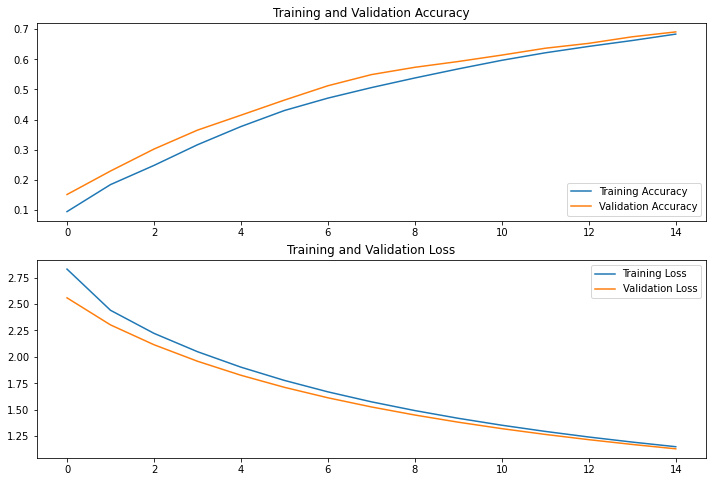

63/63 - 439s - loss: 1.1557 - accuracy: 0.6719 - 439s/epoch - 7s/step
CPU times: user 8h 47min 57s, sys: 8min 26s, total: 8h 56min 23s
Wall time: 4h 52min 48s


In [ ]:
#--- Starting trial: run-24
#{'epochs': 15, 'optimizer': 'sgd', 'learning_rate': 0.0001}
%%time
session_num = 24
hparams = {HP_EPOCHS: 15, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1


--- Starting trial: run-25
{'epochs': 15, 'optimizer': 'sgd', 'learning_rate': 0.0005}
Epoch 1/15
186/186 [==============================] - 1109s 6s/step - loss: 2.2682 - accuracy: 0.2644 - val_loss: 1.8141 - val_accuracy: 0.4141
Epoch 2/15
186/186 [==============================] - 1140s 6s/step - loss: 1.5766 - accuracy: 0.5189 - val_loss: 1.3657 - val_accuracy: 0.5925
Epoch 3/15
186/186 [==============================] - 1149s 6s/step - loss: 1.2392 - accuracy: 0.6436 - val_loss: 1.1167 - val_accuracy: 0.6830
Epoch 4/15
186/186 [==============================] - 1096s 6s/step - loss: 1.0384 - accuracy: 0.7093 - val_loss: 0.9571 - val_accuracy: 0.7366
Epoch 5/15
186/186 [==============================] - 1088s 6s/step - loss: 0.9040 - accuracy: 0.7586 - val_loss: 0.8447 - val_accuracy: 0.7841
Epoch 6/15
186/186 [==============================] - 1089s 6s/step - loss: 0.8069 - accuracy: 0.7923 - val_loss: 0.7615 - val_accuracy: 0.8165
Epoch 7/15
186/186 [=============================

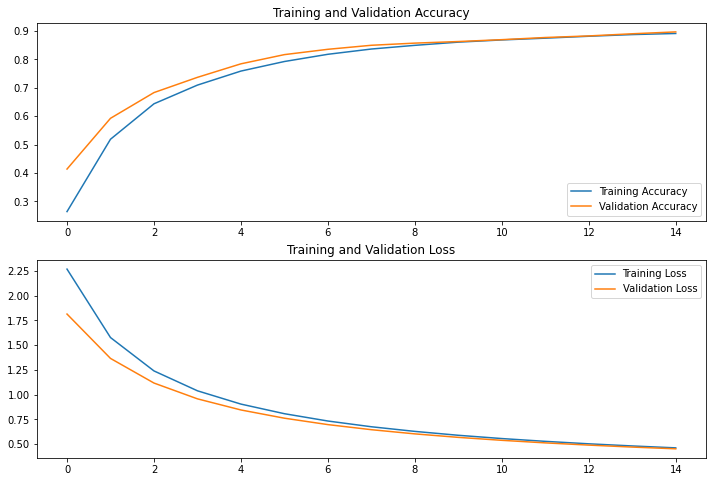

63/63 - 273s - loss: 0.5019 - accuracy: 0.8695 - 273s/epoch - 4s/step
CPU times: user 8h 44min 50s, sys: 9min 26s, total: 8h 54min 16s
Wall time: 4h 42min 29s


In [ ]:
#--- Starting trial: run-25
#{'epochs': 15, 'optimizer': 'sgd', 'learning_rate': 0.0005}
%%time
hparams = {HP_EPOCHS: 15, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-26
{'epochs': 15, 'optimizer': 'sgd', 'learning_rate': 0.001}
94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/15
186/186 [==============================] - 1354s 7s/step - loss: 1.9169 - accuracy: 0.4076 - val_loss: 1.3739 - val_accuracy: 0.5966
Epoch 2/15
186/186 [==============================] - 1251s 7s/step - loss: 1.1271 - accuracy: 0.6954 - val_loss: 0.9590 - val_accuracy: 0.7588
Epoch 3/15
186/186 [==============================] - 1251s 7s/step - loss: 0.8430 - accuracy: 0.7936 - val_loss: 0.7625 - val_accuracy: 0.8225
Epoch 4/15
186/186 [==============================] - 1260s 7s/step - loss: 0.6935 - accuracy: 0.8394 - val_loss: 0.6475 - val_accuracy: 0.8514
Epoch 5/15
186/186 [==============================] - 1272s 7s/step - loss: 0.5999 - accuracy: 0.8629 - val_loss: 0.5702 - val_accuracy: 0.8675
Epoch 6/15
186/186 [==============================] - 1319s 7s/step - loss: 0.5346 - accuracy: 0.8787 - val_loss: 0.5154 - val_ac

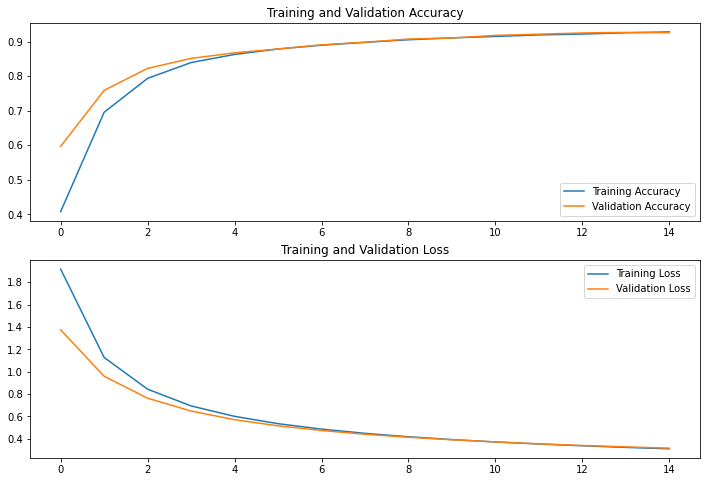

63/63 - 367s - loss: 0.3445 - accuracy: 0.9037 - 367s/epoch - 6s/step
CPU times: user 9h 54min 59s, sys: 24min 18s, total: 10h 19min 17s
Wall time: 5h 39min 12s


In [ ]:
#--- Starting trial: run-26
#{'epochs': 15, 'optimizer': 'sgd', 'learning_rate': 0.001}#
%%time
session_num = 26
hparams = {HP_EPOCHS: 15, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

In [ ]:
%tensorboard --logdir logs/hparam_tuning

## VGG19

In [20]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp
from tensorflow.keras.applications.vgg19 import VGG19

In [21]:
HP_LEARNING_RATE= hp.HParam('learning_rate', hp.Discrete( [0.001, 0.0005,0.0001]))#0.001, 0.0005,
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete([ 'sgd','rmsprop','adam']))
HP_EPOCHS = hp.HParam('epochs',hp.Discrete([2,4,6]))#You should set the number of epochs as high as possible and terminate training based on the error rates. Just mo be clear, an epoch is one learning cycle where the learner sees the whole training data set. If you have two batches, the learner needs to go through two iterations for one epoch.
#min_delta 

METRIC_ACCURACY = 'accuracy'
log_dir = 'logs/hparam_tuning'
with tf.summary.create_file_writer(log_dir).as_default():
  hp.hparams_config(
    hparams=[HP_LEARNING_RATE, HP_OPTIMIZER,HP_EPOCHS],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [22]:

def plot_history(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs_range = range(len(acc))
  plt.figure(figsize=(12, 8))
  plt.subplot(2, 1, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')
  plt.subplot(2, 1, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.show()

def train_test_model(hparams,run):
  from tensorflow.keras.applications.vgg19 import VGG19
  VGG19 = VGG19(include_top=False,weights='imagenet',input_shape=(img_height,img_width,3))

  VGG19.trainable = False
  inputs = tf.keras.Input(shape=(img_height,img_width,3))
  x = VGG19(inputs,training=False)
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  outputs = tf.keras.layers.Dense(num_classes,activation='softmax')(x)
  model = tf.keras.Model(inputs,outputs)
  #set HP
  optimizer = hparams[HP_OPTIMIZER]
  learning_rate = hparams[HP_LEARNING_RATE]
  epochs = hparams[HP_EPOCHS]
  if optimizer == "adam":
      optimizer = tf.optimizers.Adam(learning_rate=learning_rate)
  elif optimizer == "sgd":
      optimizer = tf.optimizers.SGD(learning_rate=learning_rate)
  elif optimizer=='rmsprop':
      optimizer = tf.optimizers.RMSprop(learning_rate=learning_rate)
  else:
      raise ValueError("unexpected optimizer name")

  model.compile(optimizer=optimizer,loss='sparse_categorical_crossentropy',metrics=['accuracy'])
  history = model.fit(train_ds,epochs=epochs,validation_data=val_ds)
            #callbacks=[
        #tf.keras.callbacks.TensorBoard(log_dir),  # log metrics
       # hp.KerasCallback(log_dir, hparams),# log hparams
       # ])
  plot_history(history)
  test_loss,test_acc = model.evaluate(test_ds,verbose=2)
  model.save('content/vgg19_retail_filters_object_midbalanced_run{0}.h5'.format(run))
  return test_acc


  

In [23]:
def run(run_dir, hparams,run):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams,run)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)

In [ ]:
hparams = {}
session_num = 0
HPARAMS = [HP_LEARNING_RATE, HP_OPTIMIZER,HP_EPOCHS]
HPARAMS_type = ["D","D","D"]
def grid_search(N):
  global hparams,session_num,HPARAMS,HPARAMS_type
  if(N == 0):
    run_name = "run-%d" % session_num
    print('--- Starting trial: %s' % run_name)
    print({h.name: hparams[h] for h in hparams})
    #run(log_dir+"/" + run_name, hparams,session_num)
    session_num += 1
  else:
    values = []
    if HPARAMS_type[N-1] == 'D':#if discrete
      values = HPARAMS[N-1].domain.values
    elif HPARAMS_type[N-1] == 'RI':#if real interval
      values = [HPARAMS[N-1].domain.min_value,HPARAMS[N-1].domain.max_value]
    for hparam in values:
        hparams[HPARAMS[N-1]] = hparam
        grid_search(N-1)
    

In [ ]:
grid_search(len(HPARAMS))

--- Starting trial: run-0
{'epochs': 2, 'optimizer': 'adam', 'learning_rate': 0.0001}
Epoch 1/2
186/186 [==============================] - 4430s 24s/step - loss: 6.2034 - accuracy: 0.1458 - val_loss: 4.2817 - val_accuracy: 0.2012
Epoch 2/2
186/186 [==============================] - 4393s 24s/step - loss: 3.4468 - accuracy: 0.2900 - val_loss: 2.7600 - val_accuracy: 0.3675


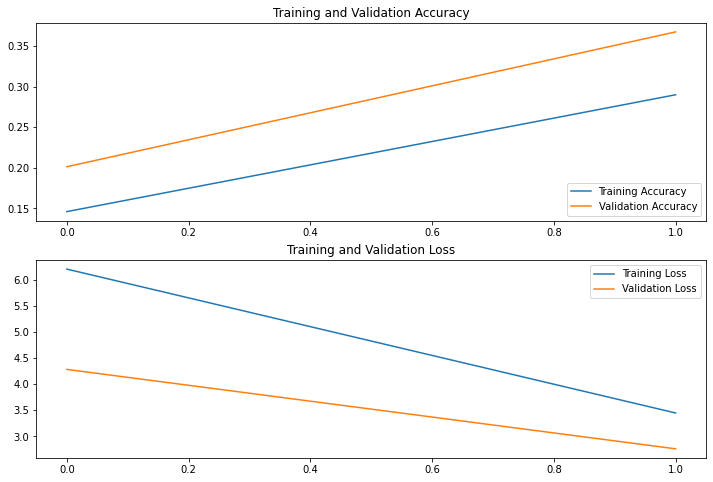

63/63 - 1167s - loss: 2.8943 - accuracy: 0.3452 - 1167s/epoch - 19s/step
CPU times: user 5h 20min 25s, sys: 1min 12s, total: 5h 21min 37s
Wall time: 2h 47min 13s


In [ ]:
%%time
session_num = 0
hparams = {HP_EPOCHS: 2, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE: 0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-1
{'epochs': 2, 'optimizer': 'adam', 'learning_rate': 0.0005}
Epoch 1/2
186/186 [==============================] - 4357s 23s/step - loss: 2.9903 - accuracy: 0.4148 - val_loss: 1.1963 - val_accuracy: 0.6668
Epoch 2/2
186/186 [==============================] - 4359s 23s/step - loss: 0.8743 - accuracy: 0.7428 - val_loss: 0.6585 - val_accuracy: 0.7947


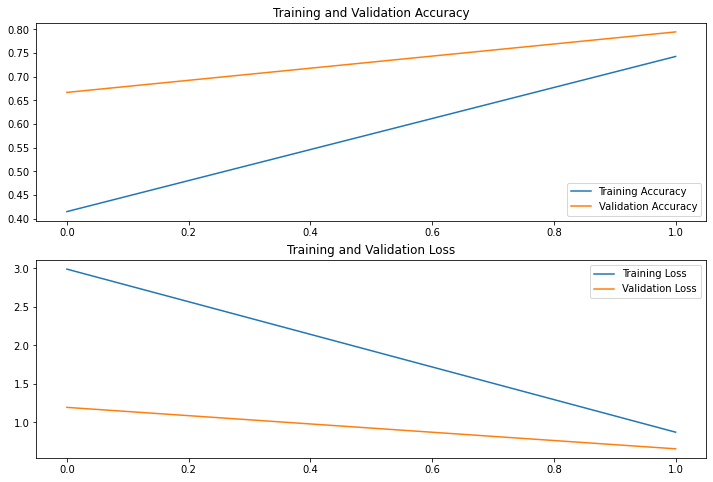

63/63 - 1096s - loss: 0.7650 - accuracy: 0.7852 - 1096s/epoch - 17s/step
CPU times: user 5h 20min 13s, sys: 52.1 s, total: 5h 21min 5s
Wall time: 2h 45min 2s


In [ ]:
%%time
hparams = {HP_EPOCHS: 2, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE: 0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-2
{'epochs': 2, 'optimizer': 'adam', 'learning_rate': 0.001}
Epoch 1/2
186/186 [==============================] - 4367s 24s/step - loss: 1.9345 - accuracy: 0.5761 - val_loss: 0.6856 - val_accuracy: 0.7770
Epoch 2/2
186/186 [==============================] - 4367s 24s/step - loss: 0.5101 - accuracy: 0.8427 - val_loss: 0.3940 - val_accuracy: 0.8777


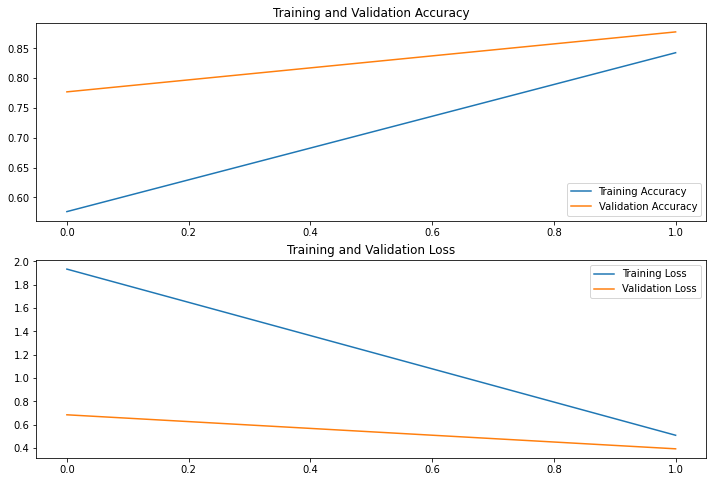

63/63 - 1099s - loss: 0.4528 - accuracy: 0.8620 - 1099s/epoch - 17s/step
CPU times: user 5h 20min 35s, sys: 52.6 s, total: 5h 21min 27s
Wall time: 2h 44min 28s


In [ ]:
%%time
hparams = {HP_EPOCHS: 2, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE: 0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-3
{'epochs': 2, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
Epoch 1/2
186/186 [==============================] - 4358s 23s/step - loss: 5.3439 - accuracy: 0.1734 - val_loss: 3.8664 - val_accuracy: 0.2826
Epoch 2/2
186/186 [==============================] - 4358s 23s/step - loss: 3.0043 - accuracy: 0.3554 - val_loss: 2.3786 - val_accuracy: 0.4408


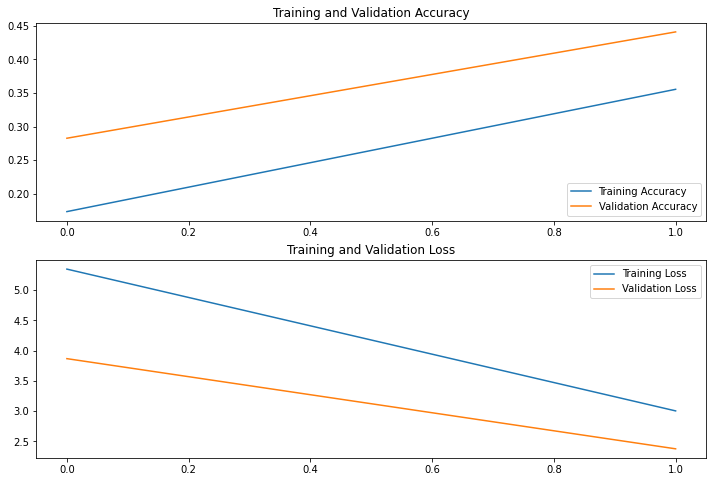

63/63 - 1097s - loss: 2.4668 - accuracy: 0.4305 - 1097s/epoch - 17s/step
CPU times: user 5h 19min 46s, sys: 53.6 s, total: 5h 20min 40s
Wall time: 2h 45min 2s


In [ ]:
%%time
hparams = {HP_EPOCHS: 2, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE: 0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-4
{'epochs': 2, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
80150528/80134624 [==============================] - 1s 0us/step
Epoch 1/2
186/186 [==============================] - 5212s 28s/step - loss: 3.0118 - accuracy: 0.3899 - val_loss: 1.2056 - val_accuracy: 0.6512
Epoch 2/2
186/186 [==============================] - 4945s 27s/step - loss: 0.8351 - accuracy: 0.7544 - val_loss: 0.6010 - val_accuracy: 0.8241


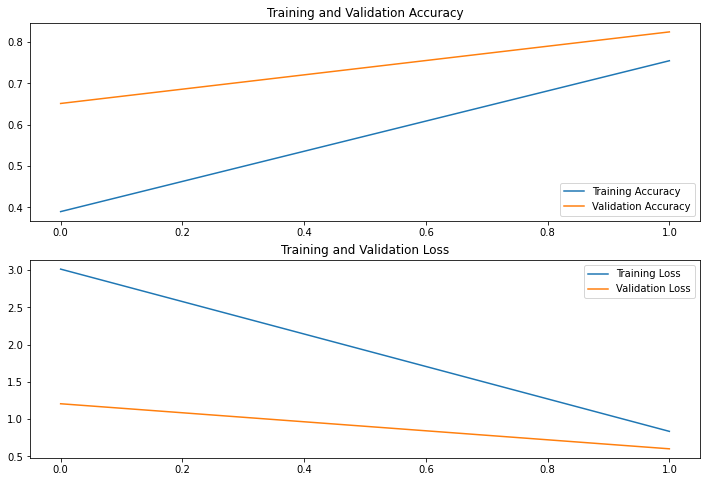

63/63 - 1373s - loss: 0.6605 - accuracy: 0.8073 - 1373s/epoch - 22s/step
CPU times: user 6h 7s, sys: 1min 28s, total: 6h 1min 35s
Wall time: 3h 13min 10s


In [ ]:
%%time
session_num=4
hparams = {HP_EPOCHS: 2, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE: 0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-5
{'epochs': 2, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
Epoch 1/2
186/186 [==============================] - 4915s 26s/step - loss: 1.7072 - accuracy: 0.6062 - val_loss: 0.6398 - val_accuracy: 0.8049
Epoch 2/2
186/186 [==============================] - 4939s 27s/step - loss: 0.4472 - accuracy: 0.8584 - val_loss: 0.3802 - val_accuracy: 0.8868


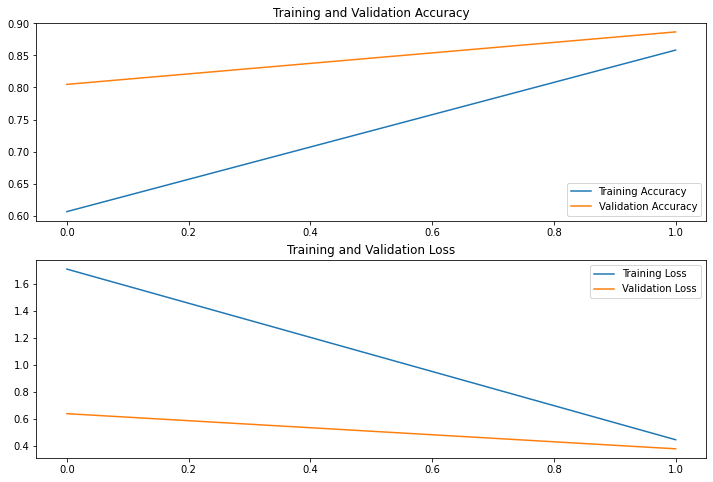

63/63 - 1245s - loss: 0.4027 - accuracy: 0.8731 - 1245s/epoch - 20s/step
CPU times: user 5h 59min 23s, sys: 1min 12s, total: 6h 36s
Wall time: 3h 5min 31s


In [ ]:
%%time
hparams = {HP_EPOCHS: 2, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE: 0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-6
{'epochs': 2, 'optimizer': 'sgd', 'learning_rate': 0.0001}
Epoch 1/2
186/186 [==============================] - 4948s 27s/step - loss: 6.9561 - accuracy: 0.0897 - val_loss: 5.3337 - val_accuracy: 0.1218
Epoch 2/2
186/186 [==============================] - 4992s 27s/step - loss: 4.5428 - accuracy: 0.1690 - val_loss: 4.0765 - val_accuracy: 0.2260


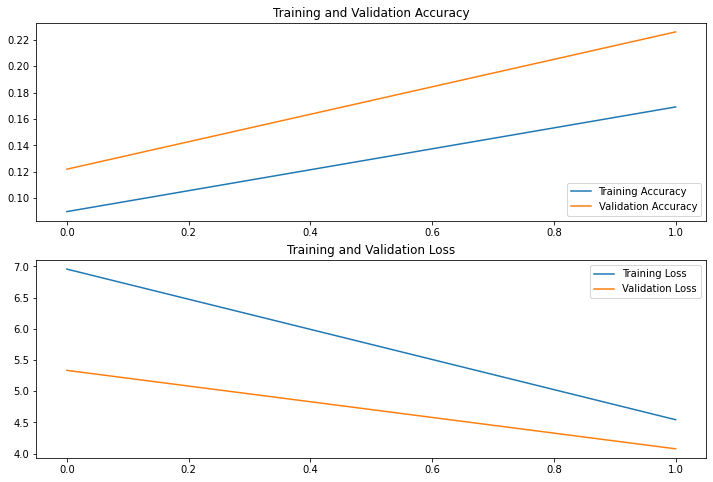

63/63 - 1263s - loss: 4.0545 - accuracy: 0.2273 - 1263s/epoch - 20s/step
CPU times: user 6h 2min 23s, sys: 1min 31s, total: 6h 3min 55s
Wall time: 3h 7min 14s


In [ ]:
%%time
hparams = {HP_EPOCHS: 2, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-7
{'epochs': 2, 'optimizer': 'sgd', 'learning_rate': 0.0005}
Epoch 1/2
186/186 [==============================] - 5106s 27s/step - loss: 4.0937 - accuracy: 0.2622 - val_loss: 2.4063 - val_accuracy: 0.4166
Epoch 2/2
186/186 [==============================] - 5158s 28s/step - loss: 1.9595 - accuracy: 0.5004 - val_loss: 1.5734 - val_accuracy: 0.5642


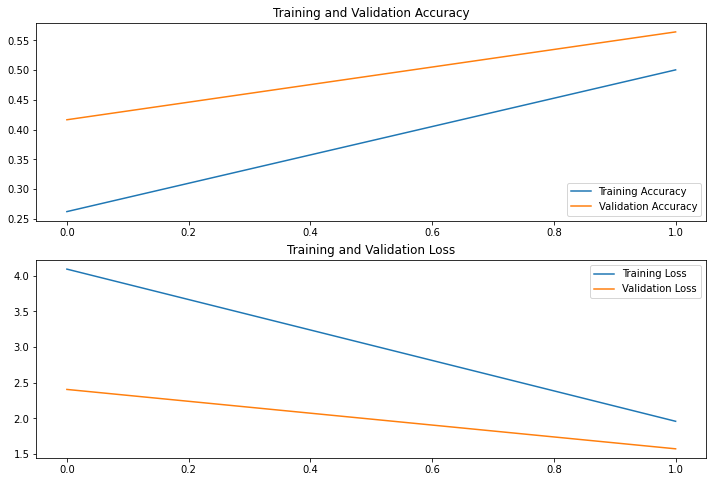

63/63 - 1295s - loss: 1.6395 - accuracy: 0.5655 - 1295s/epoch - 21s/step
CPU times: user 6h 7min 41s, sys: 4min 39s, total: 6h 12min 20s
Wall time: 3h 13min 4s


In [ ]:
%%time
session_num =7
hparams = {HP_EPOCHS: 2, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-8
{'epochs': 2, 'optimizer': 'sgd', 'learning_rate': 0.001}
80150528/80134624 [==============================] - 0s 0us/step
Epoch 1/2
186/186 [==============================] - 5028s 27s/step - loss: 2.9132 - accuracy: 0.3835 - val_loss: 1.6645 - val_accuracy: 0.5561
Epoch 2/2
186/186 [==============================] - 5027s 27s/step - loss: 1.2690 - accuracy: 0.6444 - val_loss: 1.0493 - val_accuracy: 0.7037


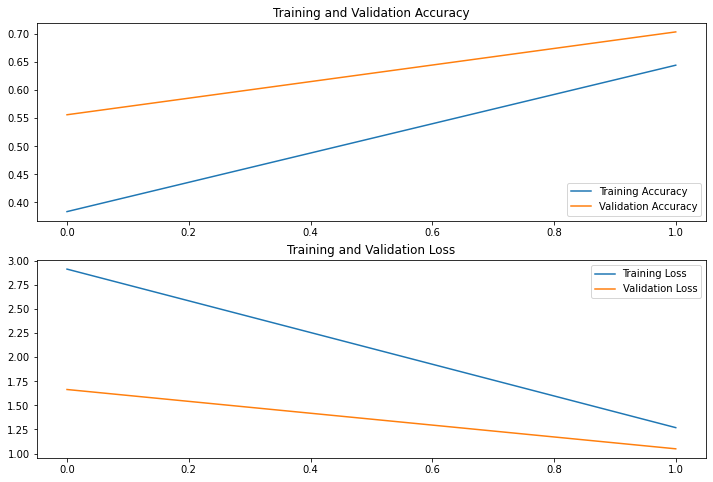

63/63 - 1313s - loss: 1.0762 - accuracy: 0.6944 - 1313s/epoch - 21s/step
CPU times: user 6h 3min 11s, sys: 1min 37s, total: 6h 4min 48s
Wall time: 3h 11min 9s


In [ ]:
%%time
session_num = 8
hparams = {HP_EPOCHS: 2, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-9
{'epochs': 4, 'optimizer': 'adam', 'learning_rate': 0.0001}
Epoch 1/4
186/186 [==============================] - 5055s 27s/step - loss: 5.5502 - accuracy: 0.1470 - val_loss: 4.1439 - val_accuracy: 0.2326
Epoch 2/4
186/186 [==============================] - 5053s 27s/step - loss: 3.2156 - accuracy: 0.3386 - val_loss: 2.6900 - val_accuracy: 0.4044
Epoch 3/4
186/186 [==============================] - 5125s 28s/step - loss: 2.1986 - accuracy: 0.4863 - val_loss: 1.9573 - val_accuracy: 0.5228
Epoch 4/4
186/186 [==============================] - 5155s 28s/step - loss: 1.6497 - accuracy: 0.5803 - val_loss: 1.5218 - val_accuracy: 0.6026


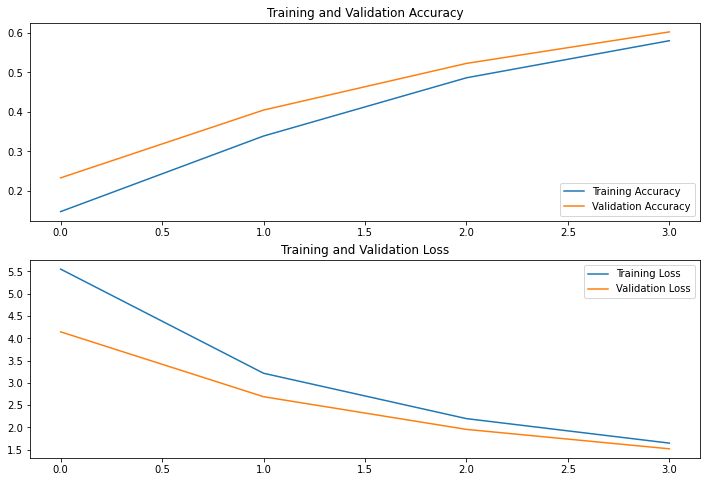

63/63 - 1285s - loss: 1.5673 - accuracy: 0.6001 - 1285s/epoch - 20s/step
CPU times: user 11h 32min 11s, sys: 5min 46s, total: 11h 37min 57s
Wall time: 6h 2min 54s


In [ ]:
%%time
hparams = {HP_EPOCHS: 4, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1
#--- Starting trial: run-9
#{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.0001}

--- Starting trial: run-10
{'epochs': 4, 'optimizer': 'adam', 'learning_rate': 0.0005}
Epoch 1/4
186/186 [==============================] - 5107s 27s/step - loss: 2.5752 - accuracy: 0.4404 - val_loss: 1.0536 - val_accuracy: 0.6987
Epoch 2/4
186/186 [==============================] - 5098s 27s/step - loss: 0.7664 - accuracy: 0.7615 - val_loss: 0.6091 - val_accuracy: 0.8064
Epoch 3/4
186/186 [==============================] - 5113s 28s/step - loss: 0.4850 - accuracy: 0.8449 - val_loss: 0.4610 - val_accuracy: 0.8504
Epoch 4/4
186/186 [==============================] - 5102s 27s/step - loss: 0.3548 - accuracy: 0.8851 - val_loss: 0.3651 - val_accuracy: 0.8883


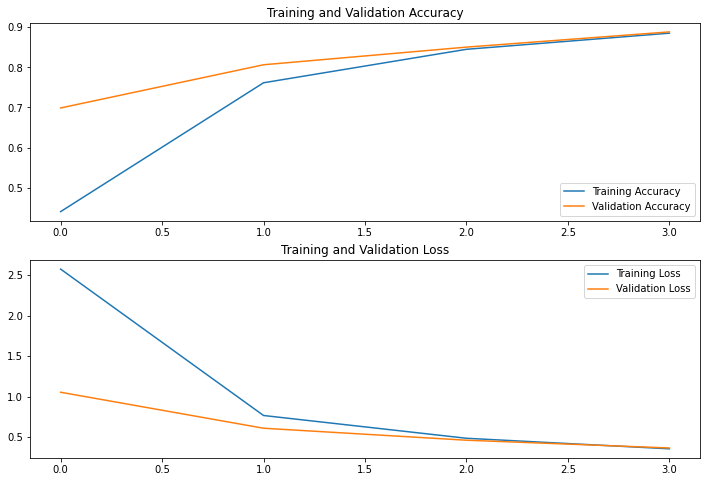

63/63 - 1284s - loss: 0.3922 - accuracy: 0.8670 - 1284s/epoch - 20s/step
CPU times: user 11h 30min 35s, sys: 8min 7s, total: 11h 38min 43s
Wall time: 6h 3min 28s


In [ ]:
%%time
session_num=10
hparams = {HP_EPOCHS: 4, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1
#--- Starting trial: run-10
#{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.0005}

--- Starting trial: run-11
{'epochs': 4, 'optimizer': 'adam', 'learning_rate': 0.001}
80150528/80134624 [==============================] - 1s 0us/step
Epoch 1/4
186/186 [==============================] - 4627s 25s/step - loss: 1.7004 - accuracy: 0.6017 - val_loss: 0.6347 - val_accuracy: 0.8023
Epoch 2/4
186/186 [==============================] - 4547s 24s/step - loss: 0.4858 - accuracy: 0.8493 - val_loss: 0.3982 - val_accuracy: 0.8782
Epoch 3/4
186/186 [==============================] - 4586s 25s/step - loss: 0.2931 - accuracy: 0.9075 - val_loss: 0.3199 - val_accuracy: 0.9029
Epoch 4/4
186/186 [==============================] - 4591s 25s/step - loss: 0.2037 - accuracy: 0.9364 - val_loss: 0.2564 - val_accuracy: 0.9216


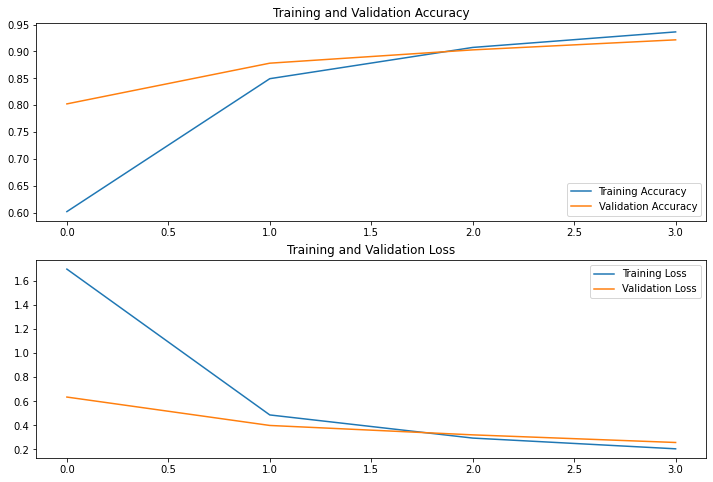

63/63 - 1248s - loss: 0.2839 - accuracy: 0.9072 - 1248s/epoch - 20s/step
CPU times: user 10h 17min 40s, sys: 6min 37s, total: 10h 24min 18s
Wall time: 5h 29min 19s


In [ ]:
#--- Starting trial: run-11
#{'epochs': 10, 'optimizer': 'adam', 'learning_rate': 0.001}
%%time
session_num=11
hparams = {HP_EPOCHS: 4, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-12
{'epochs': 4, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
Epoch 1/4
186/186 [==============================] - 4583s 25s/step - loss: 5.6393 - accuracy: 0.1362 - val_loss: 4.0541 - val_accuracy: 0.2204
Epoch 2/4
186/186 [==============================] - 4540s 24s/step - loss: 3.0934 - accuracy: 0.3087 - val_loss: 2.4767 - val_accuracy: 0.3822
Epoch 3/4
186/186 [==============================] - 4536s 24s/step - loss: 1.9569 - accuracy: 0.4824 - val_loss: 1.6722 - val_accuracy: 0.5324
Epoch 4/4
186/186 [==============================] - 4529s 24s/step - loss: 1.3754 - accuracy: 0.6103 - val_loss: 1.2487 - val_accuracy: 0.6335


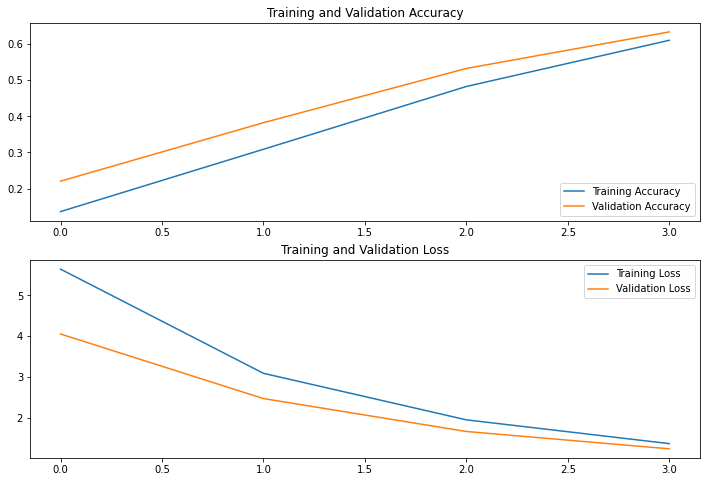

63/63 - 1143s - loss: 1.2848 - accuracy: 0.6372 - 1143s/epoch - 18s/step
CPU times: user 10h 18min 53s, sys: 6min 28s, total: 10h 25min 21s
Wall time: 5h 24min 59s


In [ ]:
#--- Starting trial: run-12
#{'epochs': 10, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
%%time
hparams = {HP_EPOCHS: 4, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-13
{'epochs': 4, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
Epoch 1/4
186/186 [==============================] - 4565s 24s/step - loss: 2.5601 - accuracy: 0.4577 - val_loss: 1.1204 - val_accuracy: 0.7002
Epoch 2/4
186/186 [==============================] - 4462s 24s/step - loss: 0.8015 - accuracy: 0.7694 - val_loss: 0.6458 - val_accuracy: 0.8150
Epoch 3/4
186/186 [==============================] - 4465s 24s/step - loss: 0.4926 - accuracy: 0.8444 - val_loss: 0.4555 - val_accuracy: 0.8589
Epoch 4/4
186/186 [==============================] - 4463s 24s/step - loss: 0.3477 - accuracy: 0.8880 - val_loss: 0.3625 - val_accuracy: 0.8852


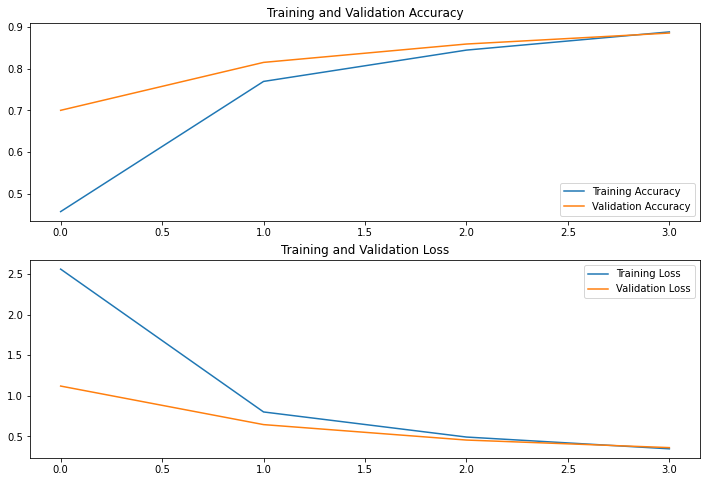

63/63 - 1196s - loss: 0.3941 - accuracy: 0.8791 - 1196s/epoch - 19s/step
CPU times: user 10h 9min 33s, sys: 4min 24s, total: 10h 13min 57s
Wall time: 5h 21min 27s


In [ ]:
#--- Starting trial: run-13
#{'epochs': 10, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
%%time
session_num=13
hparams = {HP_EPOCHS: 4, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-14
{'epochs': 4, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
Epoch 1/4
186/186 [==============================] - 4458s 24s/step - loss: 1.7632 - accuracy: 0.5990 - val_loss: 0.5787 - val_accuracy: 0.8205
Epoch 2/4
186/186 [==============================] - 4459s 24s/step - loss: 0.4320 - accuracy: 0.8565 - val_loss: 0.3947 - val_accuracy: 0.8822
Epoch 3/4
186/186 [==============================] - 4461s 24s/step - loss: 0.2536 - accuracy: 0.9174 - val_loss: 0.2672 - val_accuracy: 0.9100
Epoch 4/4
Epoch 4/4
186/186 [==============================] - 4453s 24s/step - loss: 0.1728 - accuracy: 0.9442 - val_loss: 0.2343 - val_accuracy: 0.9287


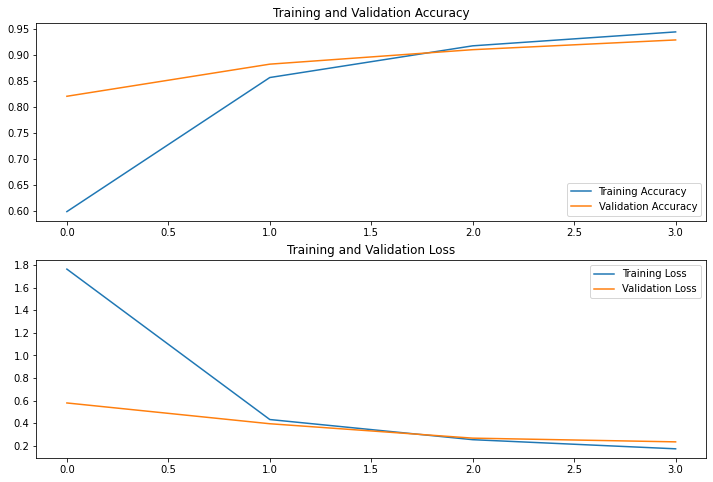

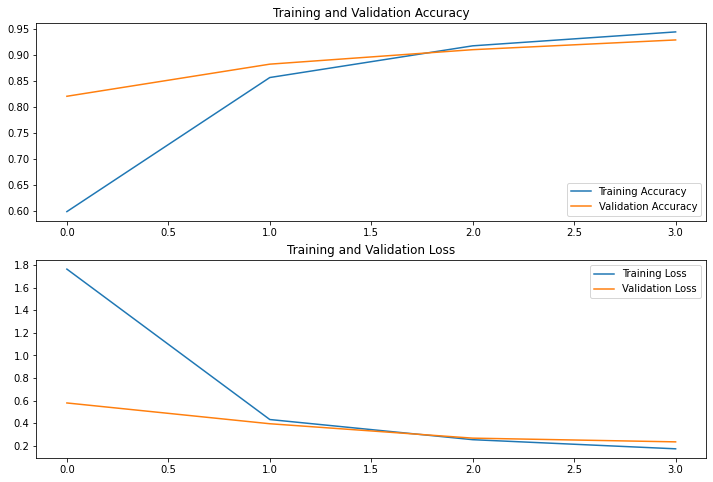

63/63 - 1125s - loss: 0.2725 - accuracy: 0.9142 - 1125s/epoch - 18s/step
63/63 - 1125s - loss: 0.2725 - accuracy: 0.9142 - 1125s/epoch - 18s/step
CPU times: user 10h 12min 23s, sys: 3min 50s, total: 10h 16min 13s
Wall time: 5h 16min 1s
CPU times: user 10h 12min 23s, sys: 3min 50s, total: 10h 16min 13s
Wall time: 5h 16min 1s


In [ ]:
#--- Starting trial: run-14
#{'epochs': 10, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
%%time
session_num=14
hparams = {HP_EPOCHS: 4, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-15
{'epochs': 4, 'optimizer': 'sgd', 'learning_rate': 0.0001}
80150528/80134624 [==============================] - 0s 0us/step
Epoch 1/4
186/186 [==============================] - 5172s 28s/step - loss: 7.3234 - accuracy: 0.0651 - val_loss: 5.6826 - val_accuracy: 0.1158
Epoch 2/4
186/186 [==============================] - 5207s 28s/step - loss: 4.9731 - accuracy: 0.1479 - val_loss: 4.4609 - val_accuracy: 0.2022
Epoch 3/4
186/186 [==============================] - 5249s 28s/step - loss: 3.9854 - accuracy: 0.2246 - val_loss: 3.6711 - val_accuracy: 0.2634
Epoch 4/4
186/186 [==============================] - 5212s 28s/step - loss: 3.3259 - accuracy: 0.2892 - val_loss: 3.1297 - val_accuracy: 0.3231


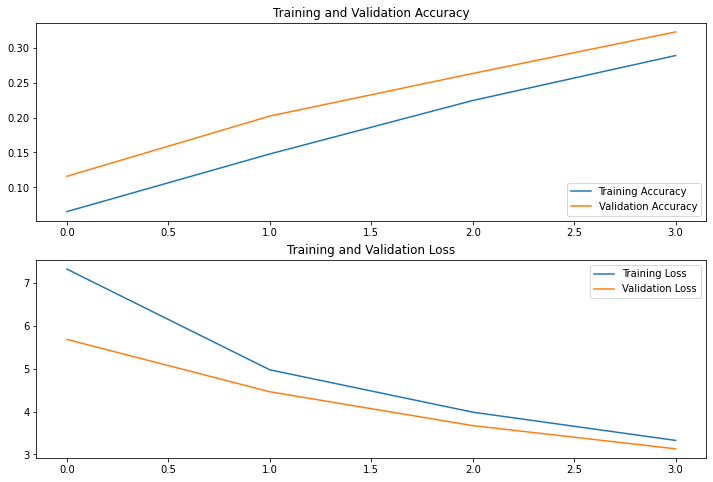

63/63 - 1343s - loss: 3.0383 - accuracy: 0.3292 - 1343s/epoch - 21s/step
CPU times: user 11h 38min 22s, sys: 8min 13s, total: 11h 46min 36s
Wall time: 6h 12min 24s


In [ ]:
#--- Starting trial: run-15
#{'epochs': 10, 'optimizer': 'sgd', 'learning_rate': 0.0001}
%%time
session_num=15
hparams = {HP_EPOCHS: 4, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-16
{'epochs': 4, 'optimizer': 'sgd', 'learning_rate': 0.0005}
Epoch 1/4
186/186 [==============================] - 5176s 28s/step - loss: 4.5176 - accuracy: 0.2343 - val_loss: 2.7595 - val_accuracy: 0.3766
Epoch 2/4
186/186 [==============================] - 5204s 28s/step - loss: 2.1119 - accuracy: 0.4749 - val_loss: 1.7120 - val_accuracy: 0.5404
Epoch 3/4
186/186 [==============================] - 5182s 28s/step - loss: 1.4493 - accuracy: 0.6007 - val_loss: 1.3033 - val_accuracy: 0.6365
Epoch 4/4
186/186 [==============================] - 5190s 28s/step - loss: 1.1460 - accuracy: 0.6747 - val_loss: 1.0852 - val_accuracy: 0.6906


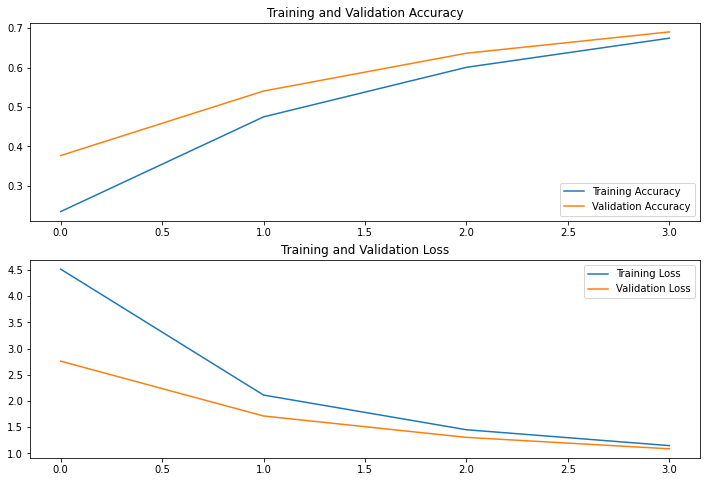

63/63 - 1309s - loss: 1.0873 - accuracy: 0.6854 - 1309s/epoch - 21s/step
CPU times: user 11h 37min 48s, sys: 8min 40s, total: 11h 46min 28s
Wall time: 6h 10min 1s


In [ ]:
#--- Starting trial: run-16
#{'epochs': 10, 'optimizer': 'sgd', 'learning_rate': 0.0005}
%%time
hparams = {HP_EPOCHS: 4, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-17
{'epochs': 4, 'optimizer': 'sgd', 'learning_rate': 0.001}
80150528/80134624 [==============================] - 1s 0us/step
Epoch 1/4
186/186 [==============================] - 5142s 27s/step - loss: 2.9664 - accuracy: 0.3640 - val_loss: 1.6535 - val_accuracy: 0.5607
Epoch 2/4
186/186 [==============================] - 5087s 27s/step - loss: 1.2636 - accuracy: 0.6360 - val_loss: 1.0637 - val_accuracy: 0.6896
Epoch 3/4
186/186 [==============================] - 5084s 27s/step - loss: 0.8739 - accuracy: 0.7319 - val_loss: 0.8153 - val_accuracy: 0.7548
Epoch 4/4
186/186 [==============================] - 5094s 27s/step - loss: 0.6920 - accuracy: 0.7837 - val_loss: 0.6858 - val_accuracy: 0.7856


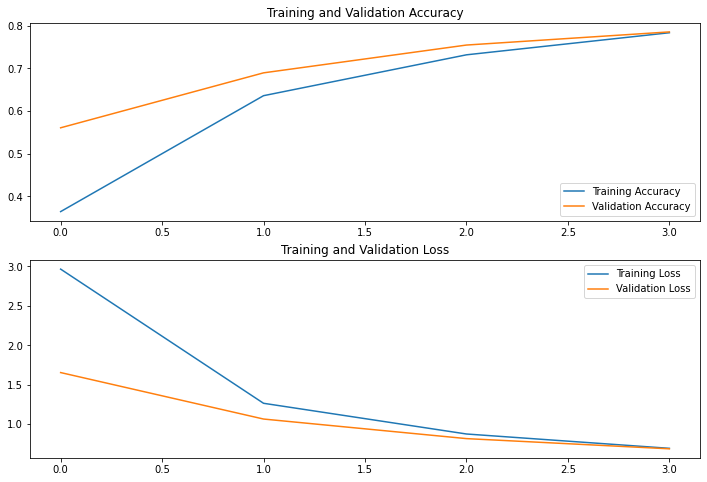

63/63 - 1347s - loss: 0.6918 - accuracy: 0.7767 - 1347s/epoch - 21s/step
CPU times: user 11h 29min 52s, sys: 5min 48s, total: 11h 35min 40s
Wall time: 6h 4min 40s


In [ ]:
#--- Starting trial: run-17
#{'epochs': 10, 'optimizer': 'sgd', 'learning_rate': 0.001}
%%time
session_num=17
hparams = {HP_EPOCHS: 4, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1


--- Starting trial: run-18
{'epochs': 6, 'optimizer': 'adam', 'learning_rate': 0.0001}
Epoch 1/6
186/186 [==============================] - 5083s 27s/step - loss: 6.3744 - accuracy: 0.1125 - val_loss: 4.4586 - val_accuracy: 0.2002
Epoch 2/6
186/186 [==============================] - 5146s 28s/step - loss: 3.4236 - accuracy: 0.2940 - val_loss: 2.8483 - val_accuracy: 0.3589
Epoch 3/6
186/186 [==============================] - 5192s 28s/step - loss: 2.2994 - accuracy: 0.4244 - val_loss: 2.0420 - val_accuracy: 0.4879
Epoch 4/6
186/186 [==============================] - 5199s 28s/step - loss: 1.6898 - accuracy: 0.5295 - val_loss: 1.5833 - val_accuracy: 0.5774
Epoch 5/6
186/186 [==============================] - 5237s 28s/step - loss: 1.3234 - accuracy: 0.6155 - val_loss: 1.2974 - val_accuracy: 0.6446
Epoch 6/6
186/186 [==============================] - 5250s 28s/step - loss: 1.0857 - accuracy: 0.6747 - val_loss: 1.1032 - val_accuracy: 0.6810


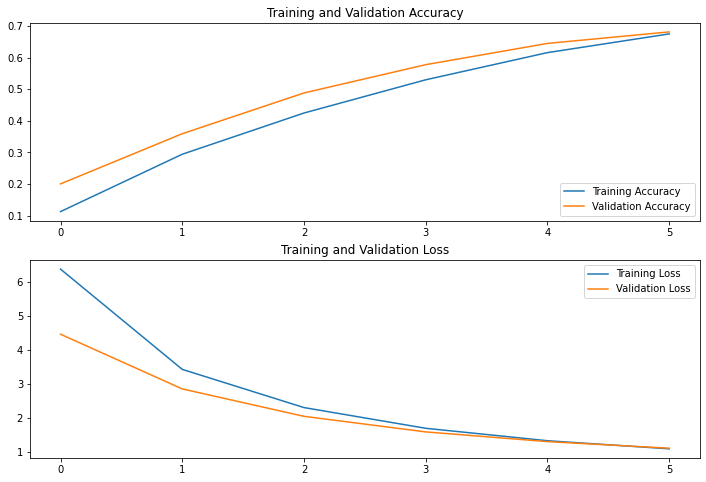

63/63 - 1309s - loss: 1.0500 - accuracy: 0.6894 - 1309s/epoch - 21s/step
CPU times: user 17h 3min 59s, sys: 14min 6s, total: 17h 18min 6s
Wall time: 9h 2min 21s


In [ ]:

#--- Starting trial: run-18
#{'epochs': 15, 'optimizer': 'adam', 'learning_rate': 0.0001}
%%time
hparams = {HP_EPOCHS: 6, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1


--- Starting trial: run-19
{'epochs': 6, 'optimizer': 'adam', 'learning_rate': 0.0005}
80150528/80134624 [==============================] - 1s 0us/step
Epoch 1/6
186/186 [==============================] - 5150s 27s/step - loss: 2.6433 - accuracy: 0.4441 - val_loss: 1.1422 - val_accuracy: 0.6623
Epoch 2/6
186/186 [==============================] - 4992s 27s/step - loss: 0.8232 - accuracy: 0.7487 - val_loss: 0.6463 - val_accuracy: 0.7952
Epoch 3/6
186/186 [==============================] - 4976s 27s/step - loss: 0.5033 - accuracy: 0.8404 - val_loss: 0.4671 - val_accuracy: 0.8524
Epoch 4/6
186/186 [==============================] - 4979s 27s/step - loss: 0.3585 - accuracy: 0.8809 - val_loss: 0.3696 - val_accuracy: 0.8948
Epoch 5/6
186/186 [==============================] - 4980s 27s/step - loss: 0.2733 - accuracy: 0.9103 - val_loss: 0.3126 - val_accuracy: 0.9080
Epoch 6/6
186/186 [==============================] - 4982s 27s/step - loss: 0.2220 - accuracy: 0.9258 - val_loss: 0.2764 - val_a

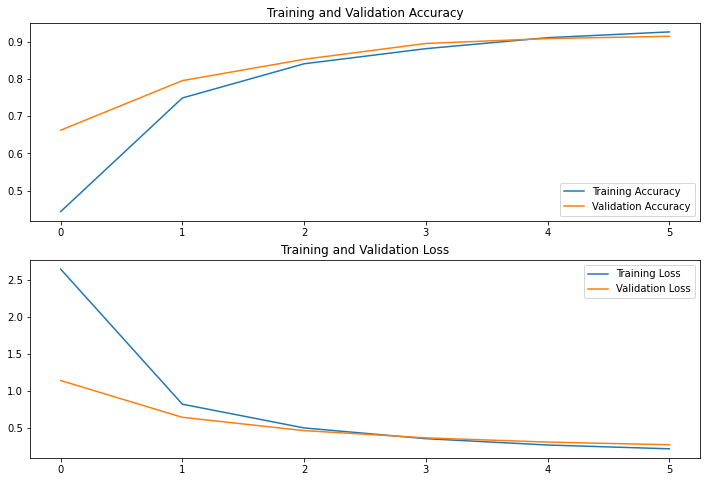

63/63 - 1317s - loss: 0.3300 - accuracy: 0.8921 - 1317s/epoch - 21s/step
CPU times: user 16h 48min 9s, sys: 3min 29s, total: 16h 51min 38s
Wall time: 8h 44min 50s


In [ ]:

#--- Starting trial: run-19
#{'epochs': 15, 'optimizer': 'adam', 'learning_rate': 0.0005}
%%time
session_num=19
hparams = {HP_EPOCHS: 6, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1



--- Starting trial: run-20
{'epochs': 6, 'optimizer': 'adam', 'learning_rate': 0.001}
80150528/80134624 [==============================] - 0s 0us/step
Epoch 1/6
186/186 [==============================] - 4570s 24s/step - loss: 2.0691 - accuracy: 0.5586 - val_loss: 0.6749 - val_accuracy: 0.7897
Epoch 2/6
186/186 [==============================] - 4528s 24s/step - loss: 0.5161 - accuracy: 0.8338 - val_loss: 0.3938 - val_accuracy: 0.8802
Epoch 3/6
186/186 [==============================] - 4586s 25s/step - loss: 0.3005 - accuracy: 0.8991 - val_loss: 0.3136 - val_accuracy: 0.9014
Epoch 4/6
186/186 [==============================] - 4598s 25s/step - loss: 0.2037 - accuracy: 0.9324 - val_loss: 0.2471 - val_accuracy: 0.9221
Epoch 5/6
186/186 [==============================] - 4598s 25s/step - loss: 0.1501 - accuracy: 0.9534 - val_loss: 0.2288 - val_accuracy: 0.9323
Epoch 6/6
186/186 [==============================] - 4617s 25s/step - loss: 0.1166 - accuracy: 0.9652 - val_loss: 0.1983 - val_ac

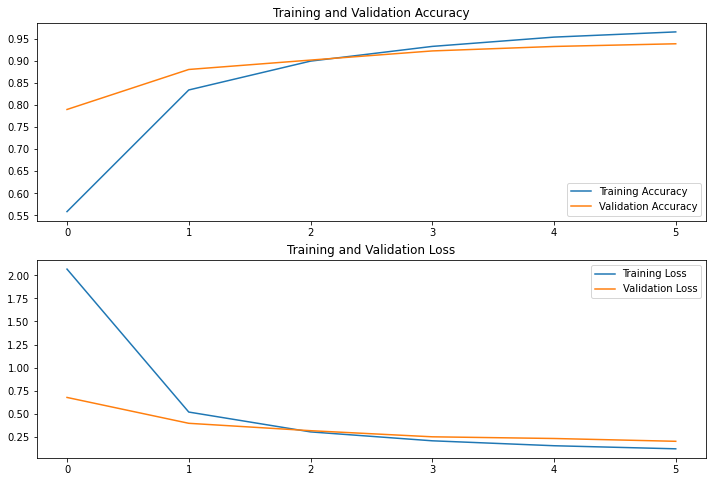

63/63 - 1198s - loss: 0.2002 - accuracy: 0.9338 - 1198s/epoch - 19s/step
CPU times: user 15h 10min 37s, sys: 9min 10s, total: 15h 19min 47s
Wall time: 8h 1min 41s


In [ ]:
#--- Starting trial: run-20
#{'epochs': 15, 'optimizer': 'adam', 'learning_rate': 0.001}
%%time
session_num = 20
hparams = {HP_EPOCHS: 6, HP_OPTIMIZER: 'adam', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-21
{'epochs': 6, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
80150528/80134624 [==============================] - 1s 0us/step
Epoch 1/6
186/186 [==============================] - 4507s 24s/step - loss: 7.5600 - accuracy: 0.1216 - val_loss: 4.8895 - val_accuracy: 0.1562
Epoch 2/6
186/186 [==============================] - 4443s 24s/step - loss: 3.6742 - accuracy: 0.2668 - val_loss: 2.8860 - val_accuracy: 0.3539
Epoch 3/6
186/186 [==============================] - 4443s 24s/step - loss: 2.2988 - accuracy: 0.4449 - val_loss: 1.9642 - val_accuracy: 0.5015
Epoch 4/6
186/186 [==============================] - 4449s 24s/step - loss: 1.6476 - accuracy: 0.5603 - val_loss: 1.4824 - val_accuracy: 0.5971
Epoch 5/6
186/186 [==============================] - 4452s 24s/step - loss: 1.2713 - accuracy: 0.6378 - val_loss: 1.1840 - val_accuracy: 0.6638
Epoch 6/6
186/186 [==============================] - 4450s 24s/step - loss: 1.0264 - accuracy: 0.6986 - val_loss: 0.9788 - va

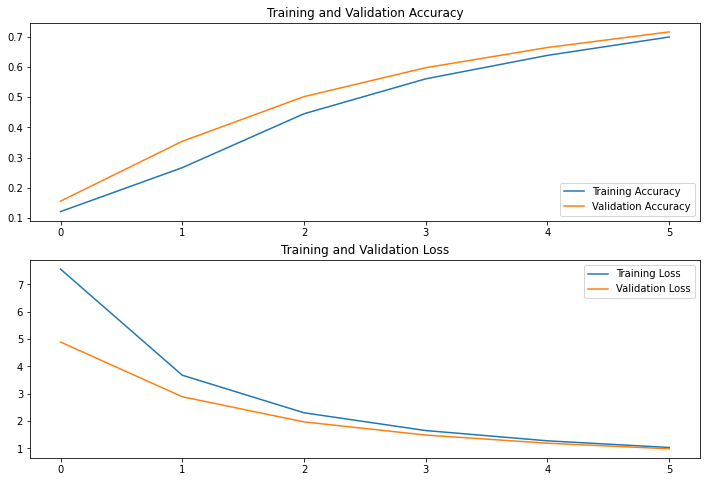

63/63 - 1181s - loss: 1.0031 - accuracy: 0.6994 - 1181s/epoch - 19s/step
CPU times: user 14h 57min 34s, sys: 6min 5s, total: 15h 3min 40s
Wall time: 7h 46min 27s


In [ ]:
#--- Starting trial: run-21
#{'epochs': 15, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}
%%time
session_num=21
hparams = {HP_EPOCHS: 6, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1


--- Starting trial: run-22
{'epochs': 6, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
80150528/80134624 [==============================] - 0s 0us/step
Epoch 1/6
186/186 [==============================] - 4570s 24s/step - loss: 2.2979 - accuracy: 0.4718 - val_loss: 0.9559 - val_accuracy: 0.7199
Epoch 2/6
186/186 [==============================] - 4460s 24s/step - loss: 0.6931 - accuracy: 0.7842 - val_loss: 0.5207 - val_accuracy: 0.8407
Epoch 3/6
186/186 [==============================] - 4482s 24s/step - loss: 0.4201 - accuracy: 0.8659 - val_loss: 0.3859 - val_accuracy: 0.8771
Epoch 4/6
186/186 [==============================] - 4491s 24s/step - loss: 0.2984 - accuracy: 0.9028 - val_loss: 0.3158 - val_accuracy: 0.8969
Epoch 5/6
186/186 [==============================] - 4504s 24s/step - loss: 0.2280 - accuracy: 0.9262 - val_loss: 0.2856 - val_accuracy: 0.9120
Epoch 6/6
186/186 [==============================] - 4519s 24s/step - loss: 0.1815 - accuracy: 0.9411 - val_loss: 0.2461 - va

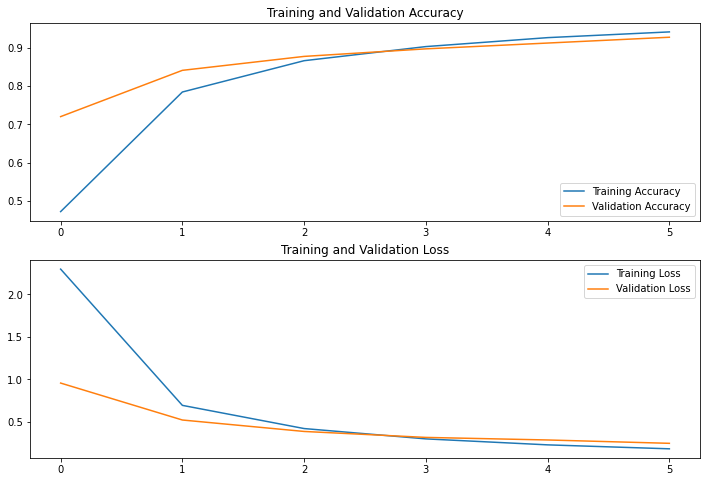

63/63 - 1206s - loss: 0.2833 - accuracy: 0.9217 - 1206s/epoch - 19s/step
CPU times: user 14h 58min 16s, sys: 8min 10s, total: 15h 6min 27s
Wall time: 7h 52min 37s


In [ ]:

#--- Starting trial: run-22
#{'epochs': 15, 'optimizer': 'rmsprop', 'learning_rate': 0.0005}
%%time
session_num = 22
hparams = {HP_EPOCHS: 6, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1



--- Starting trial: run-23
{'epochs': 6, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
80150528/80134624 [==============================] - 2s 0us/step
Epoch 1/6
186/186 [==============================] - 5145s 28s/step - loss: 1.8766 - accuracy: 0.5934 - val_loss: 0.6704 - val_accuracy: 0.8033
Epoch 2/6
186/186 [==============================] - 5094s 27s/step - loss: 0.4539 - accuracy: 0.8550 - val_loss: 0.3754 - val_accuracy: 0.8731
Epoch 3/6
186/186 [==============================] - 5048s 27s/step - loss: 0.2601 - accuracy: 0.9122 - val_loss: 0.2928 - val_accuracy: 0.9080
Epoch 4/6
186/186 [==============================] - 5065s 27s/step - loss: 0.1794 - accuracy: 0.9418 - val_loss: 0.2209 - val_accuracy: 0.9252
Epoch 5/6
186/186 [==============================] - 5099s 27s/step - loss: 0.1330 - accuracy: 0.9548 - val_loss: 0.2099 - val_accuracy: 0.9323
Epoch 6/6
186/186 [==============================] - 5070s 27s/step - loss: 0.1050 - accuracy: 0.9665 - val_loss: 0.1795 - val

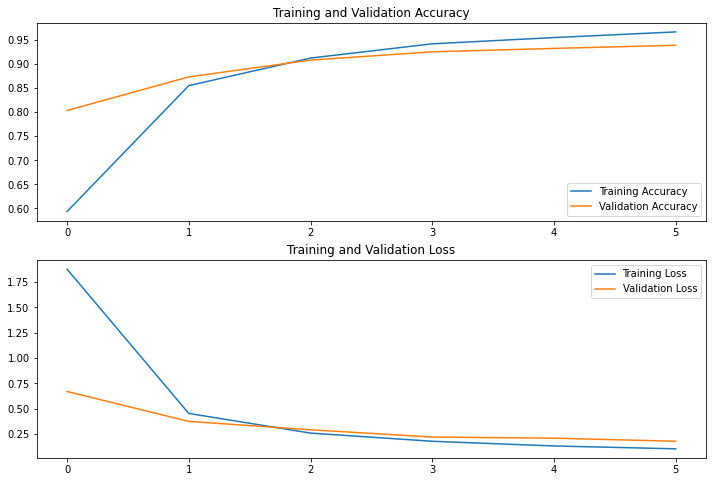

63/63 - 1312s - loss: 0.1861 - accuracy: 0.9398 - 1312s/epoch - 21s/step
CPU times: user 16h 59min 39s, sys: 4min 25s, total: 17h 4min 5s
Wall time: 8h 53min 21s


In [ ]:
#--- Starting trial: run-23
#{'epochs': 15, 'optimizer': 'rmsprop', 'learning_rate': 0.001}
%%time
session_num=23
hparams = {HP_EPOCHS: 6, HP_OPTIMIZER: 'rmsprop', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1



--- Starting trial: run-24
{'epochs': 6, 'optimizer': 'sgd', 'learning_rate': 0.0001}
Epoch 1/6
186/186 [==============================] - 4898s 26s/step - loss: 5.9849 - accuracy: 0.1046 - val_loss: 4.7423 - val_accuracy: 0.1350
Epoch 2/6
186/186 [==============================] - 4909s 26s/step - loss: 4.2043 - accuracy: 0.1830 - val_loss: 3.6713 - val_accuracy: 0.2270
Epoch 3/6
186/186 [==============================] - 4932s 27s/step - loss: 3.3797 - accuracy: 0.2755 - val_loss: 3.0391 - val_accuracy: 0.3124
Epoch 4/6
186/186 [==============================] - 4902s 26s/step - loss: 2.8710 - accuracy: 0.3455 - val_loss: 2.6278 - val_accuracy: 0.3787
Epoch 5/6
186/186 [==============================] - 4903s 26s/step - loss: 2.5207 - accuracy: 0.3987 - val_loss: 2.3347 - val_accuracy: 0.4292
Epoch 6/6
186/186 [==============================] - 4884s 26s/step - loss: 2.2596 - accuracy: 0.4412 - val_loss: 2.1118 - val_accuracy: 0.4656


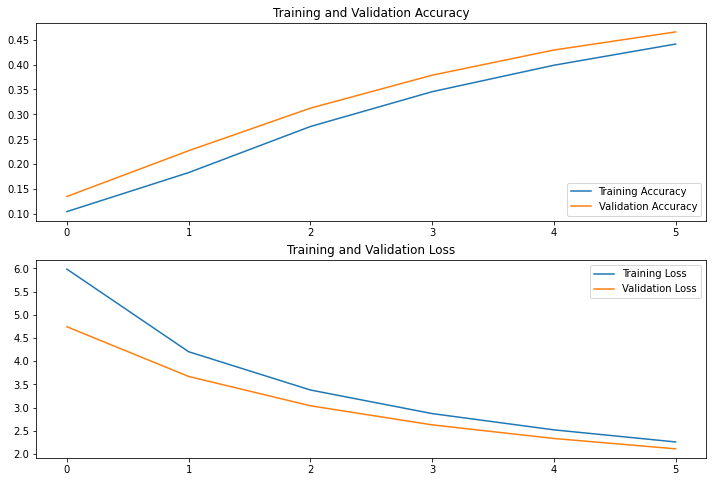

63/63 - 1288s - loss: 2.1123 - accuracy: 0.4701 - 1288s/epoch - 20s/step
CPU times: user 16h 29min 49s, sys: 3min 5s, total: 16h 32min 55s
Wall time: 8h 34min 23s


In [ ]:
#--- Starting trial: run-24
#{'epochs': 15, 'optimizer': 'sgd', 'learning_rate': 0.0001}
%%time
session_num = 24
hparams = {HP_EPOCHS: 6, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1


--- Starting trial: run-25
{'epochs': 6, 'optimizer': 'sgd', 'learning_rate': 0.0005}
Epoch 1/6
186/186 [==============================] - 4876s 26s/step - loss: 4.3202 - accuracy: 0.2340 - val_loss: 2.7181 - val_accuracy: 0.3868
Epoch 2/6
186/186 [==============================] - 4898s 26s/step - loss: 2.1301 - accuracy: 0.4780 - val_loss: 1.7612 - val_accuracy: 0.5541
Epoch 3/6
186/186 [==============================] - 4857s 26s/step - loss: 1.5128 - accuracy: 0.5985 - val_loss: 1.3600 - val_accuracy: 0.6299
Epoch 4/6
186/186 [==============================] - 4908s 26s/step - loss: 1.2067 - accuracy: 0.6646 - val_loss: 1.1339 - val_accuracy: 0.6795
Epoch 5/6
186/186 [==============================] - 4891s 26s/step - loss: 1.0163 - accuracy: 0.7071 - val_loss: 0.9841 - val_accuracy: 0.7113
Epoch 6/6
186/186 [==============================] - 4895s 26s/step - loss: 0.8864 - accuracy: 0.7383 - val_loss: 0.8820 - val_accuracy: 0.7371


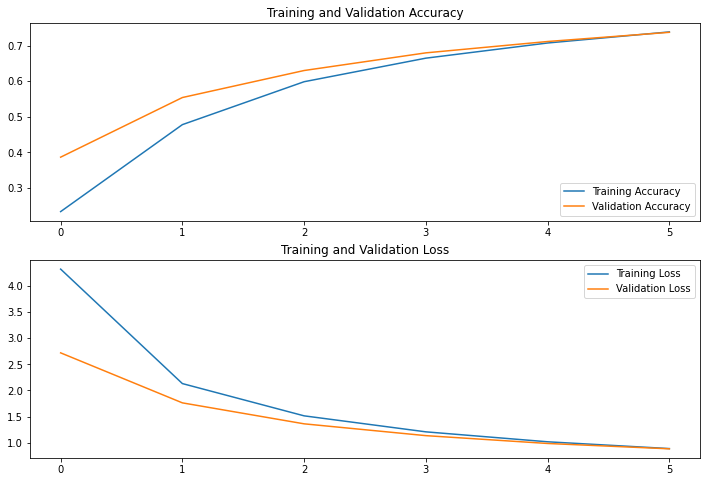

63/63 - 1230s - loss: 0.8989 - accuracy: 0.7421 - 1230s/epoch - 20s/step
CPU times: user 16h 29min 28s, sys: 2min 38s, total: 16h 32min 6s
Wall time: 8h 32min 44s


In [ ]:
#--- Starting trial: run-25
#{'epochs': 15, 'optimizer': 'sgd', 'learning_rate': 0.0005}
%%time
hparams = {HP_EPOCHS: 6, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.0005}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1

--- Starting trial: run-26
{'epochs': 6, 'optimizer': 'sgd', 'learning_rate': 0.001}
80150528/80134624 [==============================] - 1s 0us/step
Epoch 1/6
186/186 [==============================] - 4561s 24s/step - loss: 3.2883 - accuracy: 0.3509 - val_loss: 1.7661 - val_accuracy: 0.5374
Epoch 2/6
186/186 [==============================] - 4395s 24s/step - loss: 1.3024 - accuracy: 0.6272 - val_loss: 1.1167 - val_accuracy: 0.6704
Epoch 3/6
186/186 [==============================] - 4395s 24s/step - loss: 0.9053 - accuracy: 0.7231 - val_loss: 0.8662 - val_accuracy: 0.7427
Epoch 4/6
186/186 [==============================] - 4383s 24s/step - loss: 0.7205 - accuracy: 0.7694 - val_loss: 0.7334 - val_accuracy: 0.7776
Epoch 5/6
186/186 [==============================] - 4396s 24s/step - loss: 0.6084 - accuracy: 0.8061 - val_loss: 0.6400 - val_accuracy: 0.8023
Epoch 6/6
186/186 [==============================] - 4385s 24s/step - loss: 0.5317 - accuracy: 0.8276 - val_loss: 0.5845 - val_acc

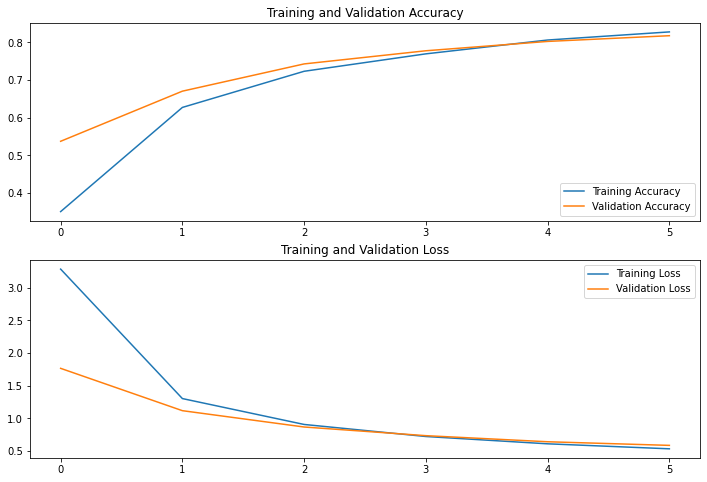

63/63 - 1175s - loss: 0.5940 - accuracy: 0.8154 - 1175s/epoch - 19s/step
CPU times: user 14h 51min 7s, sys: 3min, total: 14h 54min 8s
Wall time: 7h 42min 24s


In [24]:
#--- Starting trial: run-26
#{'epochs': 15, 'optimizer': 'sgd', 'learning_rate': 0.001}#
%%time
session_num=26
hparams = {HP_EPOCHS: 6, HP_OPTIMIZER: 'sgd', HP_LEARNING_RATE:  0.001}
run_name = "run-%d" % session_num
print('--- Starting trial: %s' % run_name)
print({h.name: hparams[h] for h in hparams})
run(log_dir+"/" + run_name, hparams,session_num)
session_num += 1